##Import Libraries##

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import ast
from collections import Counter
from datetime import datetime
from sklearn.impute import SimpleImputer
from geopy.distance import geodesic
from sklearn.neighbors import BallTree
import folium
from folium.plugins import HeatMap
import plotly.offline as pyo
import plotly.graph_objs as go
from wordcloud import WordCloud

##Load Dataset##

In [2]:
Sydney = pd.read_csv("/content/SydneyListings.csv")

##Initial Exploratory Data Analysis##

In [3]:
print(Sydney.info())
print(Sydney.describe())
print(Sydney['last_scraped'])

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18017 entries, 0 to 18016
Data columns (total 79 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            18017 non-null  int64  
 1   listing_url                                   18017 non-null  object 
 2   scrape_id                                     18017 non-null  int64  
 3   last_scraped                                  18017 non-null  object 
 4   source                                        18017 non-null  object 
 5   name                                          18017 non-null  object 
 6   description                                   17703 non-null  object 
 7   neighborhood_overview                         8410 non-null   object 
 8   picture_url                                   18017 non-null  object 
 9   host_id                                       18017 non-null 

##Data Cleaning##

In [4]:
print("--- Initial Dataset Information ---")
print(Sydney.info())

print("\n--- Initial Descriptive Statistics ---")
print(Sydney.describe())

# Drop mostly null columns and specific irrelevant columns
print("\n--- Dropping Columns with High Null Percentage ---")
# First, let's calculate the percentage of null values in each column
null_percentage = Sydney.isnull().mean() * 100

# Set a threshold for "mostly null"
threshold = 90

# Get columns that are above the threshold or entirely null
columns_to_drop = null_percentage[null_percentage >= threshold].index.tolist()

# Drop these columns from the DataFrame
Sydney1 = Sydney.drop(columns=columns_to_drop)

specific_columns = ['calendar_updated', 'neighbourhood_group_cleansed', 'license']
Sydney1 = Sydney1.drop(columns=[col for col in specific_columns if col in Sydney1.columns])

# Print the columns that were dropped
print(f"Dropped columns: {columns_to_drop + [col for col in specific_columns if col in Sydney.columns]}")

print("\n--- DataFrame Info After Initial Column Dropping ---")
print(Sydney1.info())

--- Initial Dataset Information ---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18017 entries, 0 to 18016
Data columns (total 79 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            18017 non-null  int64  
 1   listing_url                                   18017 non-null  object 
 2   scrape_id                                     18017 non-null  int64  
 3   last_scraped                                  18017 non-null  object 
 4   source                                        18017 non-null  object 
 5   name                                          18017 non-null  object 
 6   description                                   17703 non-null  object 
 7   neighborhood_overview                         8410 non-null   object 
 8   picture_url                                   18017 non-null  object 
 9   host_id                  

##Data Cleaning: Feature Selection##


--- DataFrame Info After Selecting Relevant Columns ---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18017 entries, 0 to 18016
Data columns (total 37 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              18017 non-null  int64  
 1   name                            18017 non-null  object 
 2   host_id                         18017 non-null  int64  
 3   host_name                       18009 non-null  object 
 4   host_since                      18009 non-null  object 
 5   host_is_superhost               17295 non-null  object 
 6   neighbourhood                   8410 non-null   object 
 7   host_neighbourhood              4914 non-null   object 
 8   host_total_listings_count       18009 non-null  float64
 9   latitude                        18017 non-null  float64
 10  longitude                       18017 non-null  float64
 11  property_type                   1801

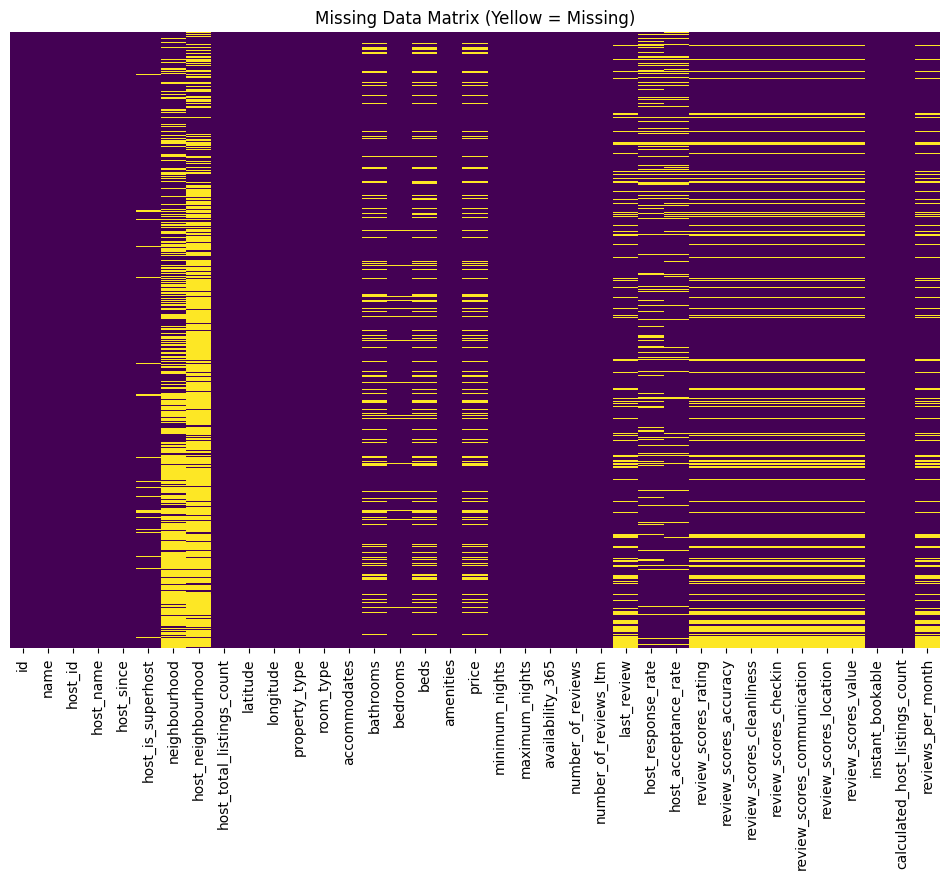

In [5]:
"""Keep relevant variables"""

# List of relevant columns for price modeling
relevant_columns = [
    'id', 'name', 'host_id', 'host_name', 'host_since', 'host_is_superhost', 'neighbourhood', 'host_neighbourhood', 'host_total_listings_count', 'latitude', 'longitude', 'property_type',
    'room_type', 'accommodates', 'bathrooms', 'bedrooms', 'beds', 'amenities', 'price', 'minimum_nights', 'maximum_nights', 'availability_365',
    'number_of_reviews', 'number_of_reviews_ltm', 'last_review', 'host_response_rate', 'host_acceptance_rate', 'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication',
    'review_scores_location', 'review_scores_value', 'instant_bookable', 'calculated_host_listings_count', 'reviews_per_month'
]

# Filter the dataframe
Sydney1 = Sydney1[relevant_columns].copy()

print("\n--- DataFrame Info After Selecting Relevant Columns ---")
Sydney1.info()

# Calculate missing values
missing = Sydney1.isnull().sum()
missing_percent = (missing / len(Sydney1)) * 100

print("\n--- Missing Value Summary (Before Imputation) ---")
print(pd.DataFrame({'Missing Count': missing, 'Missing Percentage': missing_percent}).sort_values('Missing Count', ascending=False))

# Create a missing data matrix
plt.figure(figsize=(12, 8))
sns.heatmap(Sydney1.isnull(), cbar=False, cmap='viridis', yticklabels=False)
plt.title('Missing Data Matrix (Yellow = Missing)')
plt.xticks(rotation=90)
plt.show()

##Data Cleaning: Type Conversion and Initial Formatting##

In [6]:
# Convert price to numeric (remove $ and commas)
Sydney1['price'] = Sydney1['price'].str.replace('[$,]', '', regex=True).astype(float)
print("\n--- Price Column Head (After Cleaning) ---")
print(Sydney1['price'].head())

# Drop Price NA value
Sydney1.dropna(subset=['price'], inplace=True)
print("\n--- Price Column Head (After Dropping NA) ---")
print(Sydney1['price'].head())
print("\n--- Price Descriptive Statistics (After Cleaning) ---")
print(Sydney1['price'].describe())

# ===== Drop NaN values in host_since =====
print("\n--- Before Dropping host_since NA Values ---")
print(f"Total rows: {len(Sydney1)}")
print(f"Missing host_since: {Sydney1['host_since'].isna().sum()}")

Sydney1.dropna(subset=['host_since'], inplace=True)

print("\n--- After Dropping host_since NA Values ---")
print(f"Remaining rows: {len(Sydney1)}")
print(f"Earliest host since: {Sydney1['host_since'].min()}")
print(f"Latest host since: {Sydney1['host_since'].max()}")

# Convert boolean columns
Sydney1['host_is_superhost'] = Sydney1['host_is_superhost'].map({'t': 1, 'f': 0})
Sydney1['instant_bookable'] = Sydney1['instant_bookable'].map({'t': 1, 'f': 0})

print("\n--- Superhost Status Descriptive Statistics ---")
print(Sydney1['host_is_superhost'].describe())
print("\n--- Instant Bookable Status Descriptive Statistics ---")
print(Sydney1['instant_bookable'].describe())

# Convert date columns
Sydney1['host_since'] = pd.to_datetime(Sydney1['host_since'])
Sydney1['last_review'] = pd.to_datetime(Sydney1['last_review'])

# Extract year from host_since for analysis
Sydney1['year'] = Sydney1['host_since'].dt.year

# Summary statistics for numerical columns
num_cols = Sydney1.select_dtypes(include=['int64', 'float64']).columns
print("\n--- Descriptive Statistics for Numerical Columns (after initial cleaning) ---")
print(Sydney1[num_cols].describe())


--- Price Column Head (After Cleaning) ---
0    657.0
1    210.0
2    157.0
3    950.0
4     65.0
Name: price, dtype: float64

--- Price Column Head (After Dropping NA) ---
0    657.0
1    210.0
2    157.0
3    950.0
4     65.0
Name: price, dtype: float64

--- Price Descriptive Statistics (After Cleaning) ---
count    15544.000000
mean       371.576300
std        655.741298
min         16.000000
25%        152.000000
50%        234.000000
75%        373.000000
max      29199.000000
Name: price, dtype: float64

--- Before Dropping host_since NA Values ---
Total rows: 15544
Missing host_since: 6

--- After Dropping host_since NA Values ---
Remaining rows: 15538
Earliest host since: 2009-09-02
Latest host since: 2025-03-01

--- Superhost Status Descriptive Statistics ---
count    14913.000000
mean         0.322001
std          0.467259
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max          1.000000
Name: host_is_superhost, dtype: float64

---

##Visualizations Univariate Analysis##


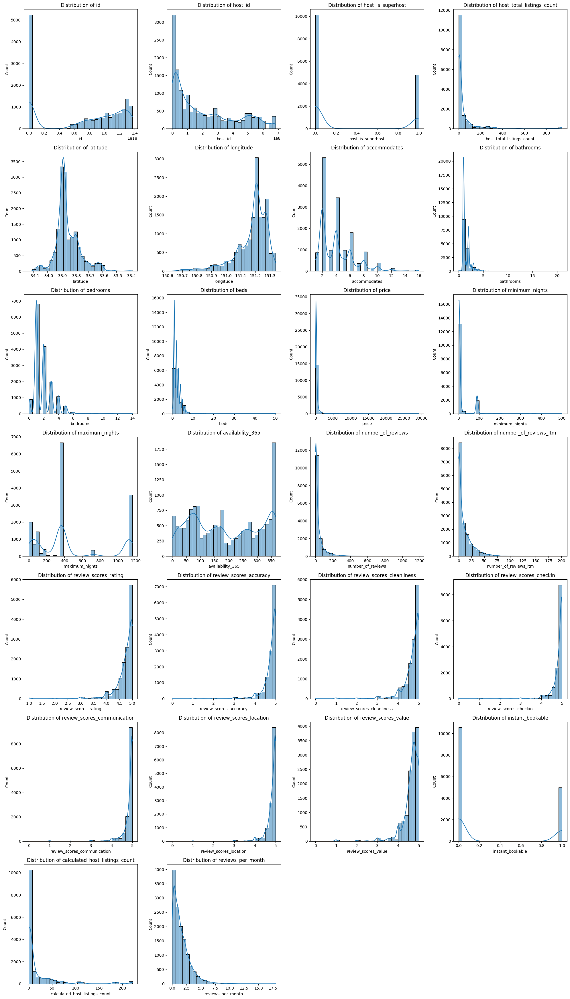

/tmp/ipython-input-7-2151146362.py:35: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.



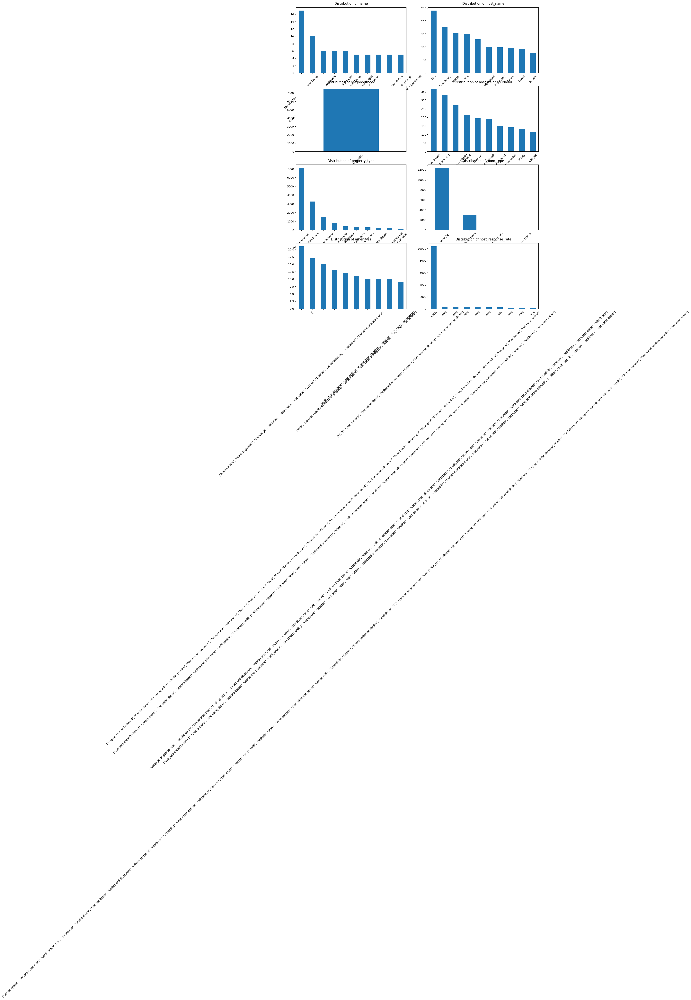

In [7]:
# Get numerical columns (int and float)
num_cols = Sydney1.select_dtypes(include=['int64', 'float64']).columns
n_cols = len(num_cols)

# Calculate grid size dynamically
n_rows = (n_cols // 4) + (1 if n_cols % 4 != 0 else 0)  # 4 columns per row

plt.figure(figsize=(20, 5 * n_rows))  # Adjust height based on rows
for i, col in enumerate(num_cols, 1):
    plt.subplot(n_rows, 4, i)
    sns.histplot(data=Sydney1, x=col, bins=30, kde=True)
    plt.title(f'Distribution of {col}')
plt.tight_layout()
plt.show()

# Visualization for categorical variables
# Identify categorical columns
cat_cols = Sydney1.select_dtypes(include=['object', 'category']).columns.tolist()

# Now create the visualization
plt.figure(figsize=(16, 20))
for i, col in enumerate(cat_cols[:8]):  # First 8 categorical columns
    plt.subplot(4, 2, i+1)

    # For high cardinality columns (many unique values), show just top 10
    if Sydney1[col].nunique() > 10:
        Sydney1[col].value_counts().head(10).plot(kind='bar')
    else:
        Sydney1[col].value_counts().plot(kind='bar')

    plt.title(f'Distribution of {col}', pad=10)
    plt.xticks(rotation=45)
    plt.xlabel('')

plt.tight_layout()
plt.show()

##Bivariate Analysis and Price Exploration##


--- Price Percentiles ---
count    15538.000000
mean       371.605741
std        655.855043
min         16.000000
1%          48.000000
5%          69.000000
25%        152.000000
50%        234.000000
75%        373.000000
95%       1044.150000
99%       2500.000000
max      29199.000000
Name: price, dtype: float64


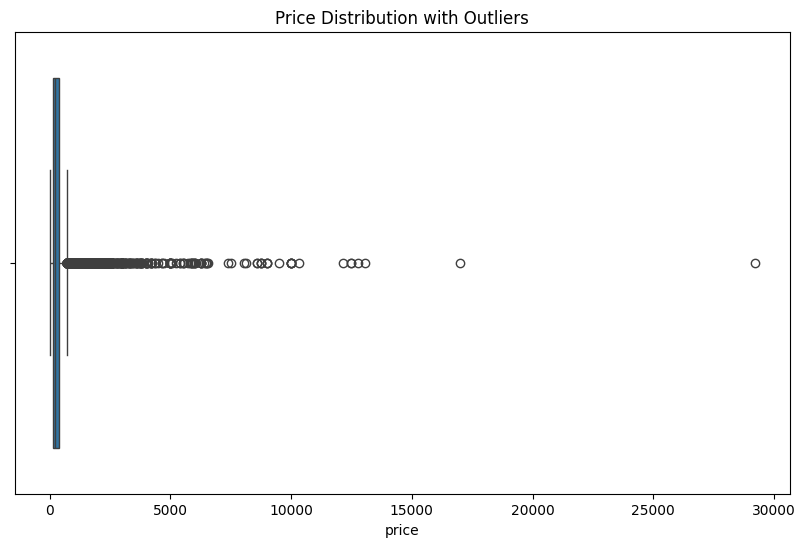

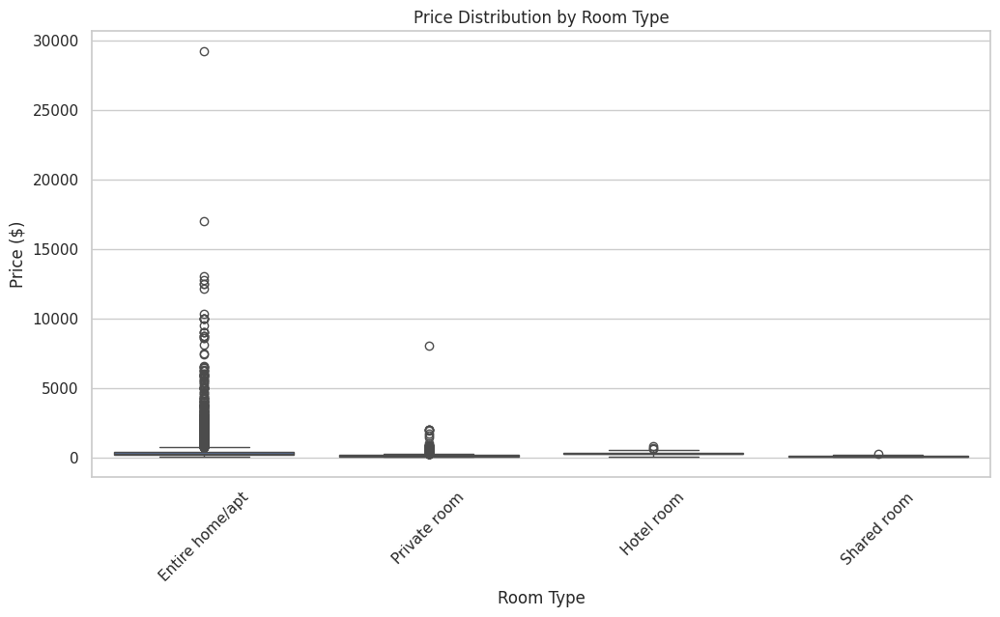

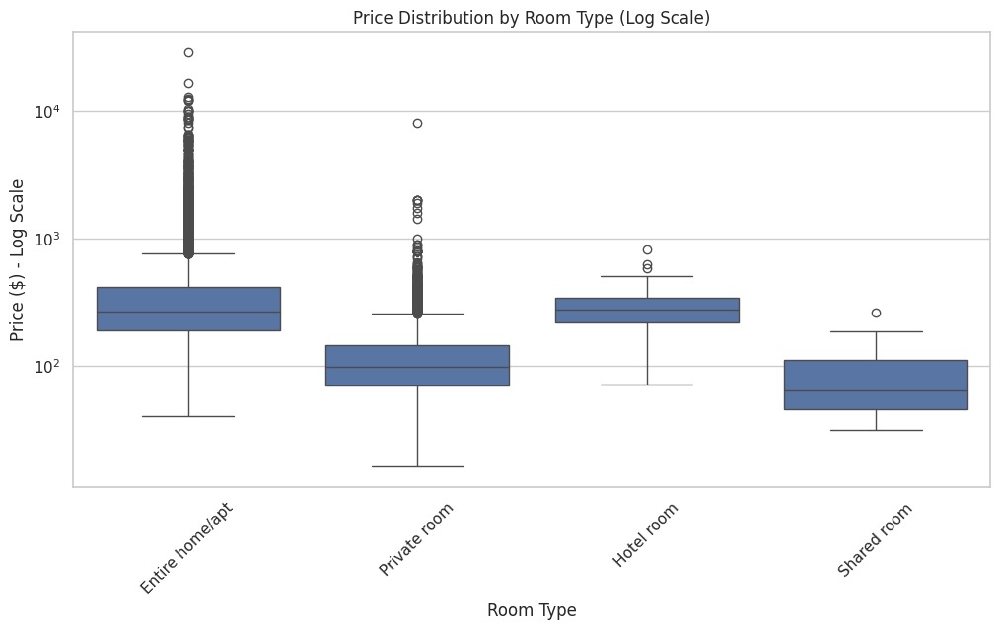

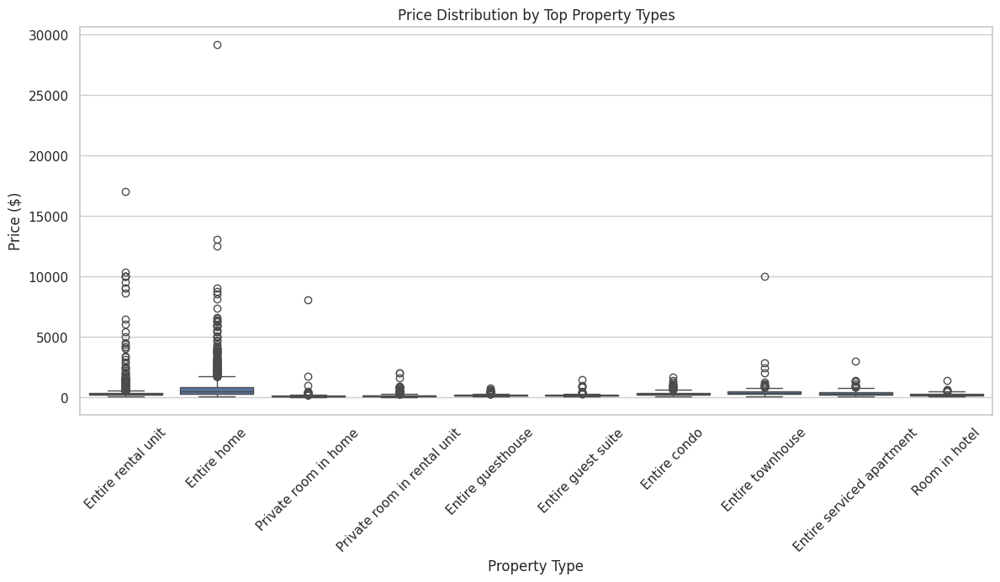

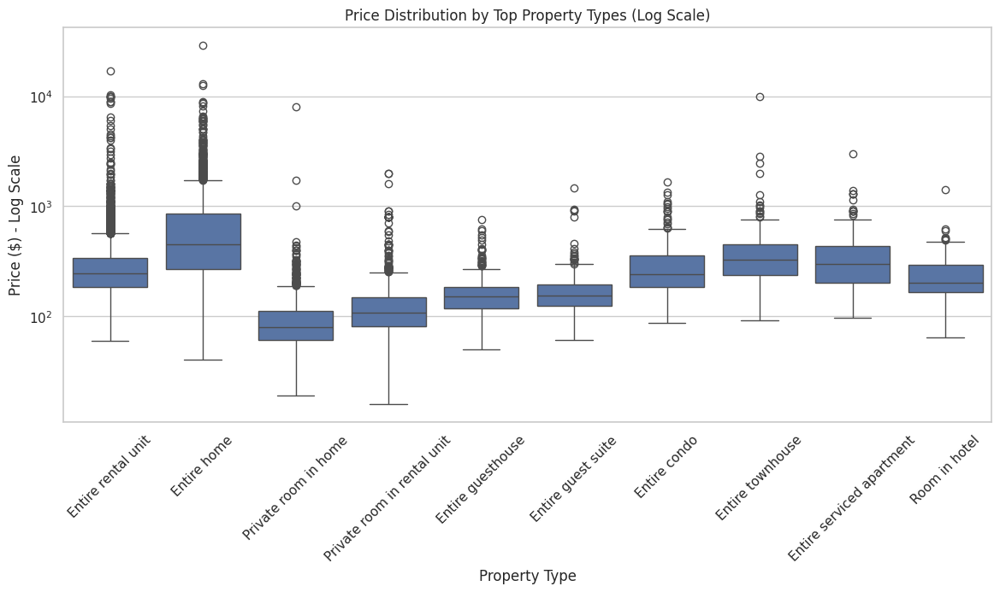

/tmp/ipython-input-8-2666193381.py:70: FutureWarning:

The provided callable <function median at 0x78b7ff12b6a0> is currently using DataFrameGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "median" instead.



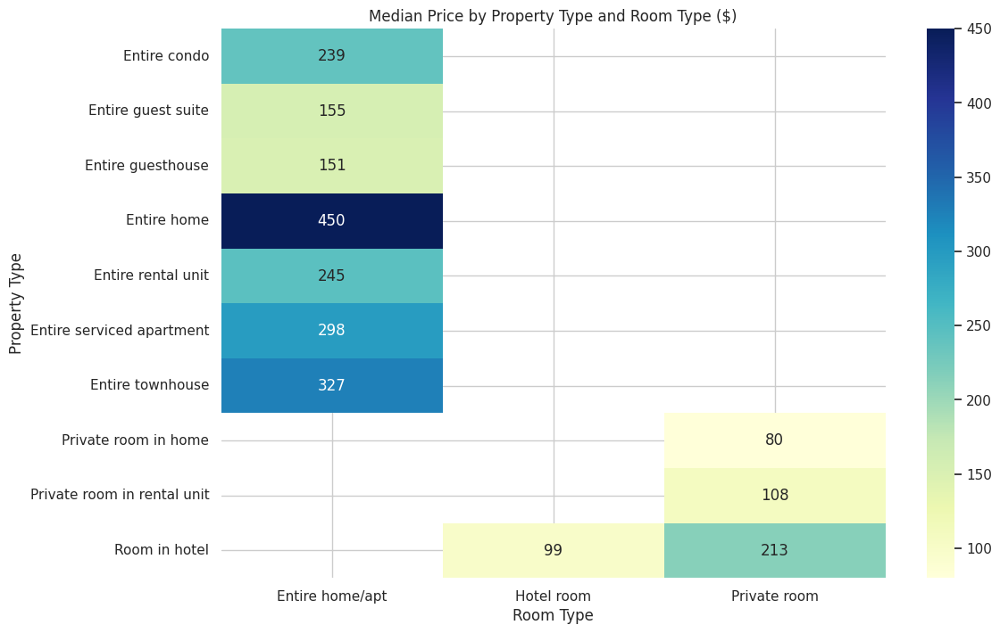


--- Formatted Price Table by Year and Room Type (Avg/Median) ---


,Year,Avg Price (Entire Home),Avg Price (Private Room),Avg Price (Shared Room),Median Price (Entire Home),Median Price (Private Room),Median Price (Shared Room)
0,2009,$182.33,$99.67,$0.00,$182.00,$115.00,$0.00
1,2010,$525.22,$130.83,$0.00,$321.00,$145.00,$0.00
2,2011,$422.50,$124.75,$260.00,$272.00,$106.50,$260.00
3,2012,$563.26,$121.27,$55.00,$322.50,$100.00,$55.00
4,2013,$448.69,$184.03,$0.00,$301.00,$112.00,$0.00
5,2014,$694.29,$125.14,$64.00,$353.50,$108.00,$64.00
6,2015,$420.95,$129.11,$52.80,$270.00,$99.00,$48.50
7,2016,$414.61,$138.15,$0.00,$279.00,$94.50,$0.00
8,2017,$345.55,$145.96,$0.00,$241.50,$100.00,$0.00
9,2018,$453.06,$141.97,$0.00,$248.00,$94.00,$0.00



--- Detailed Price Table by Year and Room Type (Min/Max/Avg/Median) ---


/tmp/ipython-input-8-2666193381.py:168: FutureWarning:

DataFrame.applymap has been deprecated. Use DataFrame.map instead.

/tmp/ipython-input-8-2666193381.py:168: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Year,Min (Entire),Min (Private),Min (Shared),Max (Entire),Max (Private),Max (Shared),Avg (Entire),Avg (Private),Avg (Shared),Median (Entire),Median (Private),Median (Shared)
0,2009,$120.00,$65.00,$0.00,$238.00,$119.00,$0.00,$182.33,$99.67,$0.00,$182.00,$115.00,$0.00
1,2010,$138.00,$55.00,$0.00,"$3,000.00",$193.00,$0.00,$525.22,$130.83,$0.00,$321.00,$145.00,$0.00
2,2011,$65.00,$46.00,$260.00,"$2,200.00",$600.00,$260.00,$422.50,$124.75,$260.00,$272.00,$106.50,$260.00
3,2012,$92.00,$48.00,$55.00,"$7,390.00",$420.00,$55.00,$563.26,$121.27,$55.00,$322.50,$100.00,$55.00
4,2013,$84.00,$35.00,$0.00,"$9,499.00","$8,039.00",$0.00,$448.69,$184.03,$0.00,$301.00,$112.00,$0.00
5,2014,$60.00,$44.00,$64.00,"$29,199.00",$600.00,$64.00,$694.29,$125.14,$64.00,$353.50,$108.00,$64.00
6,2015,$49.00,$27.00,$31.00,"$10,343.00","$2,000.00",$80.00,$420.95,$129.11,$52.80,$270.00,$99.00,$48.50
7,2016,$61.00,$28.00,$0.00,"$8,999.00","$2,000.00",$0.00,$414.61,$138.15,$0.00,$279.00,$94.50,$0.00
8,2017,$50.00,$29.00,$0.00,"$4,999.00","$1,900.00",$0.00,$345.55,$145.96,$0.00,$241.50,$100.00,$0.00
9,2018,$53.00,$16.00,$0.00,"$13,056.00","$1,736.00",$0.00,$453.06,$141.97,$0.00,$248.00,$94.00,$0.00


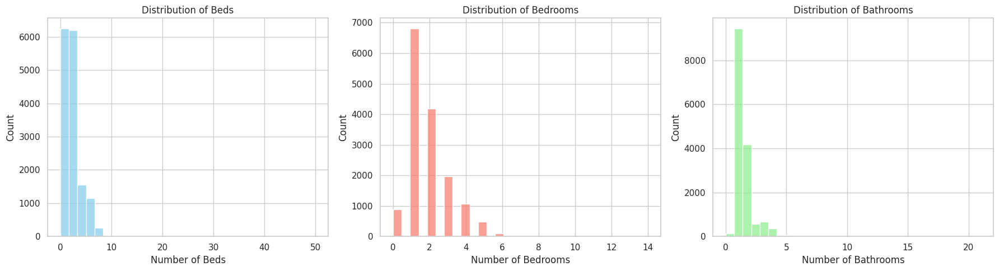

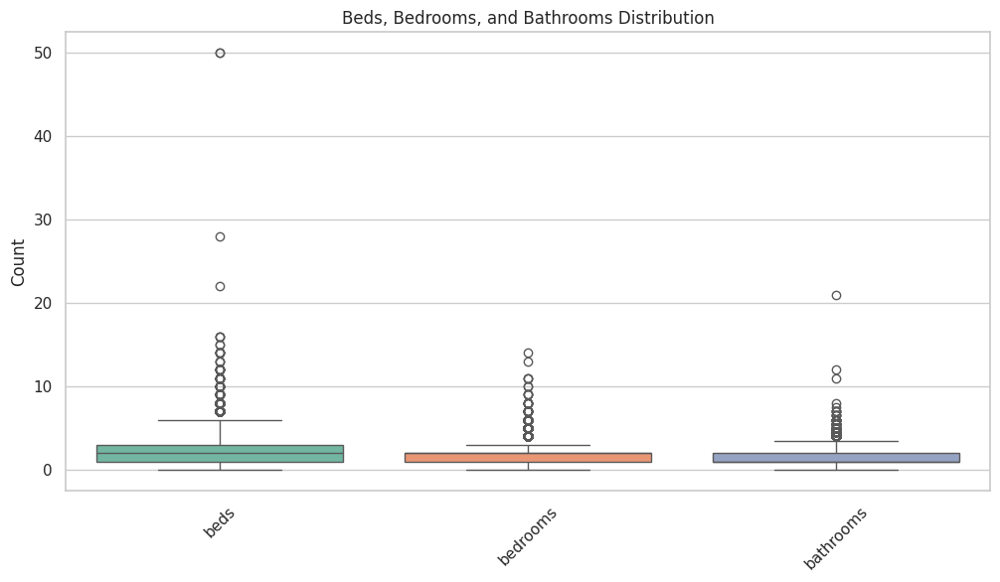

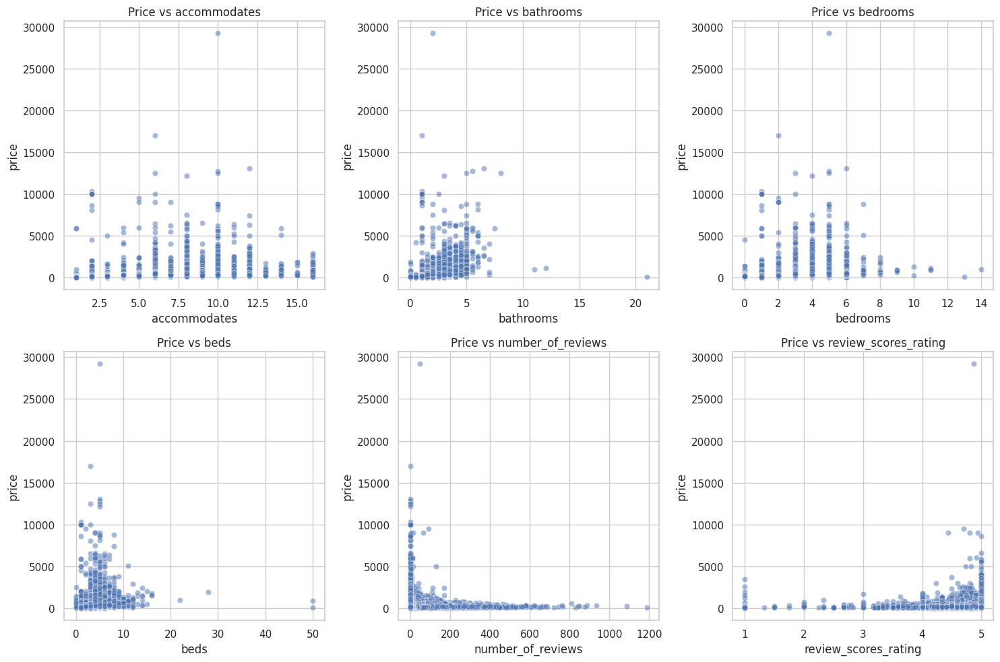


--- Correlation Matrix of Numerical Features ---


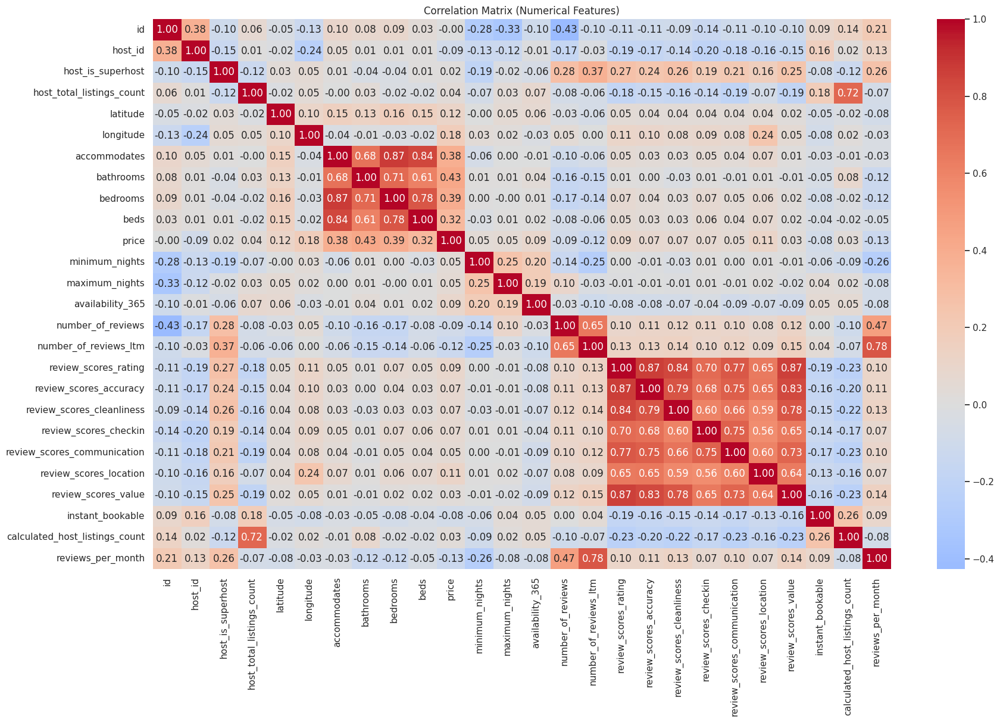


--- Top features correlated with price ---
price                             1.000000
bathrooms                         0.429420
bedrooms                          0.393594
accommodates                      0.381750
beds                              0.323143
longitude                         0.175928
latitude                          0.116867
review_scores_location            0.113551
availability_365                  0.088808
review_scores_rating              0.086091
review_scores_accuracy            0.071059
review_scores_checkin             0.067516
review_scores_cleanliness         0.067445
maximum_nights                    0.052704
review_scores_communication       0.047702
minimum_nights                    0.045300
host_total_listings_count         0.035261
review_scores_value               0.028433
calculated_host_listings_count    0.027743
host_is_superhost                 0.015677
id                               -0.003224
instant_bookable                 -0.077802
host_id   

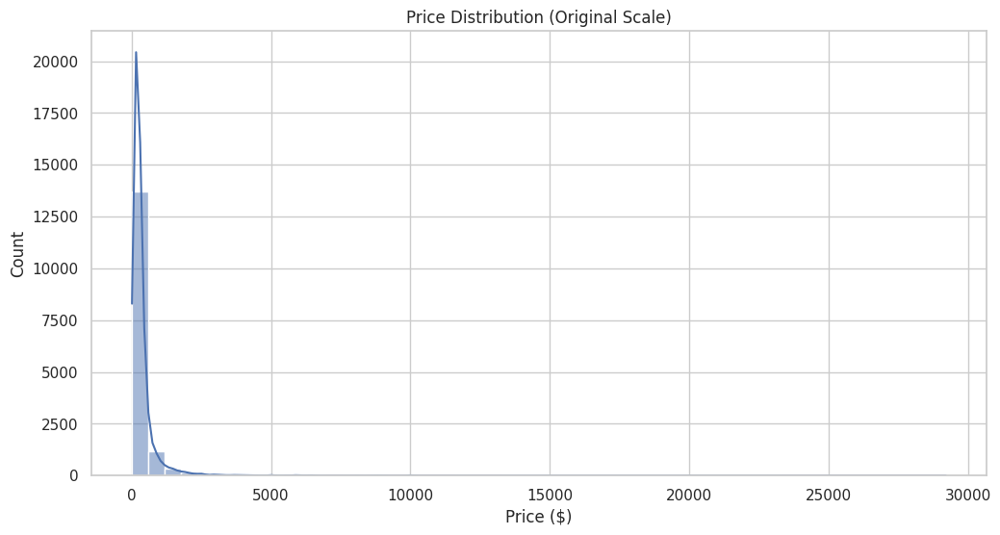

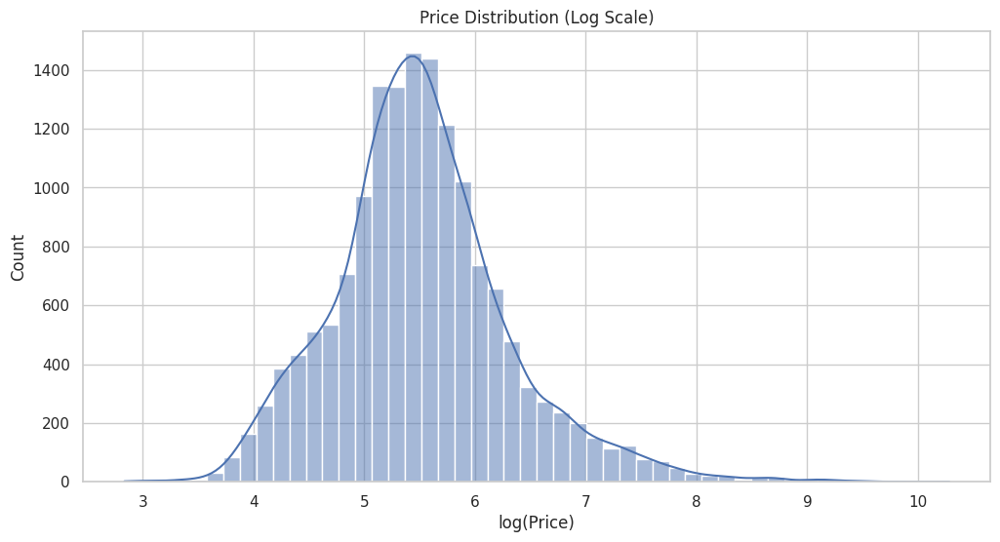

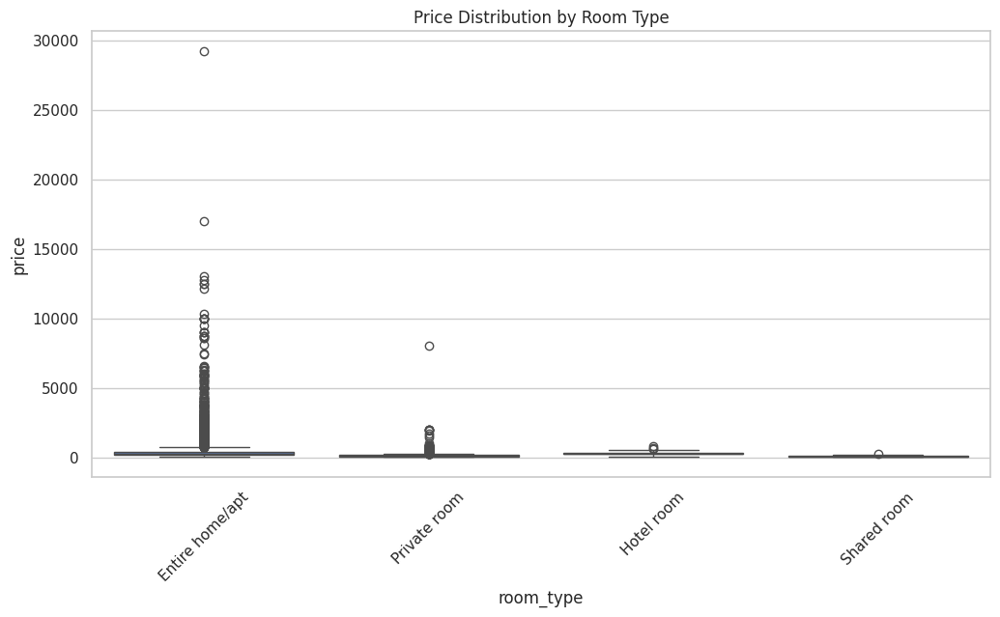

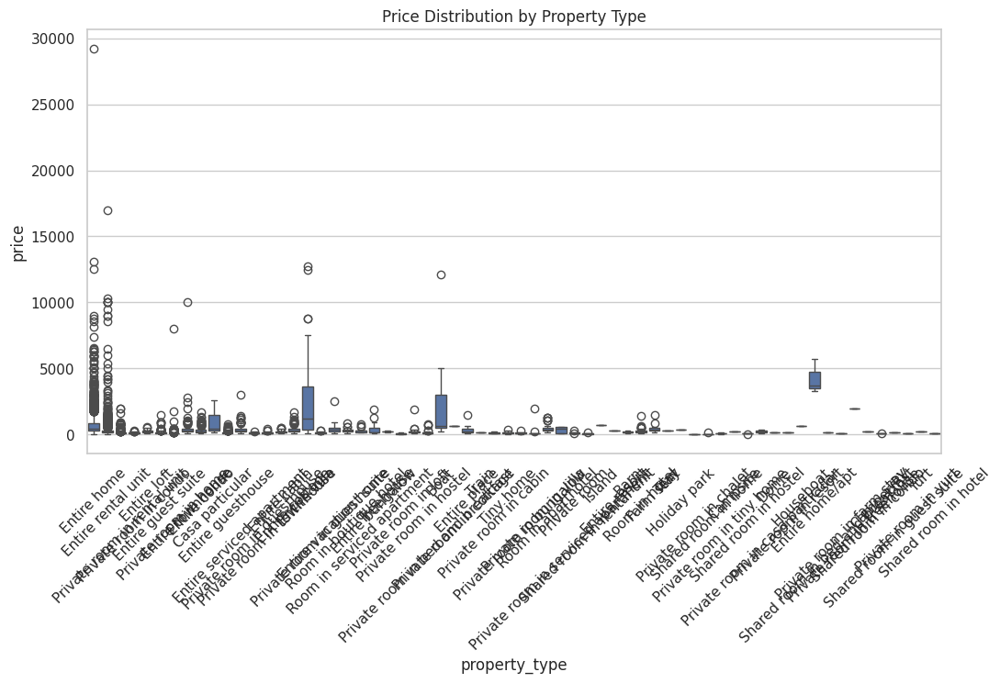

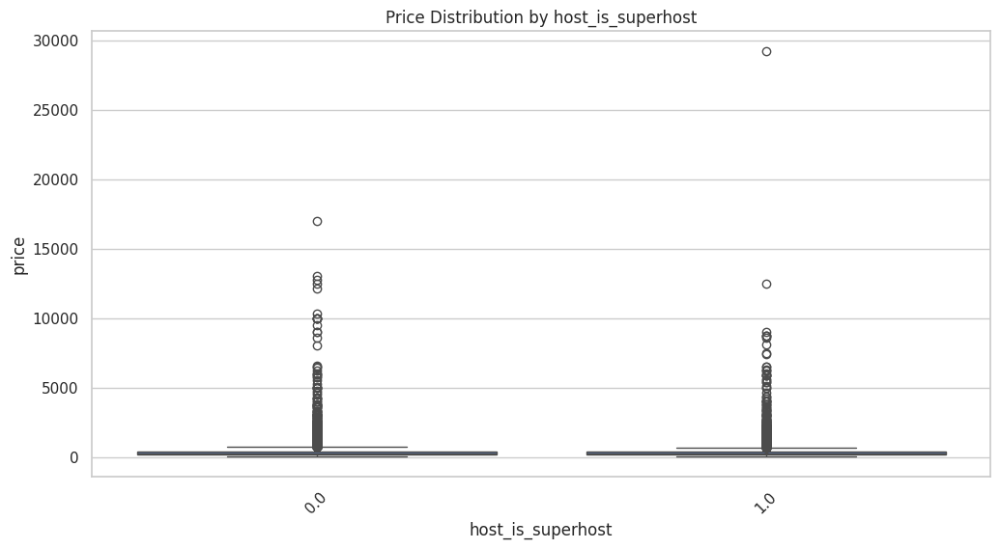

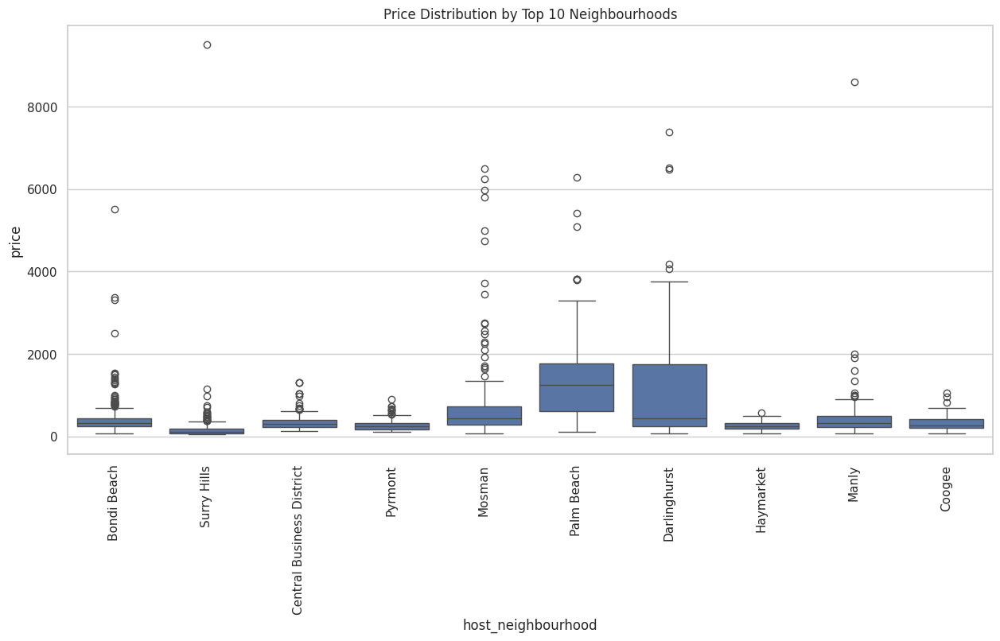

In [8]:
"""Bivariate Analysis"""

# Calculate key percentiles for price
price_stats = Sydney1['price'].describe(percentiles=[.01, .05, .25, .5, .75, .95, .99])
print("\n--- Price Percentiles ---")
print(price_stats)

# Visualize price distribution with outliers
plt.figure(figsize=(10, 6))
sns.boxplot(x=Sydney1['price'])
plt.title('Price Distribution with Outliers')
plt.show()

# Set style for better visuals
sns.set(style="whitegrid")

# Price Distribution by Room Type
plt.figure(figsize=(12, 6))
sns.boxplot(x='room_type', y='price', data=Sydney1)
plt.title('Price Distribution by Room Type')
plt.xlabel('Room Type')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.show()

# Price Distribution by Room Type (Log Scale)
plt.figure(figsize=(12, 6))
sns.boxplot(x='room_type', y='price', data=Sydney1)
plt.yscale('log')  # Log scale to better visualize wide price ranges
plt.title('Price Distribution by Room Type (Log Scale)')
plt.xlabel('Room Type')
plt.ylabel('Price ($) - Log Scale')
plt.xticks(rotation=45)
plt.show()

# Price Distribution by Top Property Types
# Get top N property types by count (adjust number as needed)
top_properties = Sydney1['property_type'].value_counts().nlargest(10).index

plt.figure(figsize=(14, 6))
sns.boxplot(
    x='property_type',
    y='price',
    data=Sydney1[Sydney1['property_type'].isin(top_properties)],
    order=top_properties
)
plt.title('Price Distribution by Top Property Types')
plt.xlabel('Property Type')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)
plt.show()

# Price Distribution by Top Property Types (Log Scale)
plt.figure(figsize=(14, 6))
sns.boxplot(
    x='property_type',
    y='price',
    data=Sydney1[Sydney1['property_type'].isin(top_properties)],
    order=top_properties
)
plt.yscale('log')
plt.title('Price Distribution by Top Property Types (Log Scale)')
plt.xlabel('Property Type')
plt.ylabel('Price ($) - Log Scale')
plt.xticks(rotation=45)
plt.show()

# Average Price by Room and Property Type (Heatmap)
# Create a cross-tabulation of average prices
cross_tab = pd.pivot_table(
    Sydney1[Sydney1['property_type'].isin(top_properties)],
    values='price',
    index='property_type',
    columns='room_type',
    aggfunc=np.median
)

plt.figure(figsize=(12, 8))
sns.heatmap(cross_tab, annot=True, fmt=".0f", cmap="YlGnBu")
plt.title('Median Price by Property Type and Room Type ($)')
plt.xlabel('Room Type')
plt.ylabel('Property Type')
plt.show()

# Create the summary table
price_summary = Sydney1.groupby(['year', 'room_type']).agg(
    Listings_Count=('id', 'count'),
    Avg_Price=('price', 'mean'),
    Median_Price=('price', 'median')
).reset_index()

# Pivot to get room types as columns
pivoted_price = price_summary.pivot_table(
    index='year',
    columns='room_type',
    values=['Avg_Price', 'Median_Price'],
    fill_value=0
)

# Flatten multi-index columns
pivoted_price.columns = [f"{col[1]}_{col[0]}" for col in pivoted_price.columns]
pivoted_price.reset_index(inplace=True)

# Format the table for display
formatted_price_table = pivoted_price.copy()
formatted_price_table['Year'] = formatted_price_table['year']
formatted_price_table = formatted_price_table[[
    'Year',
    'Entire home/apt_Avg_Price', 'Private room_Avg_Price', 'Shared room_Avg_Price',
    'Entire home/apt_Median_Price', 'Private room_Median_Price', 'Shared room_Median_Price'
]]

# Rename columns to match your requested format
formatted_price_table.columns = [
    'Year',
    'Avg Price (Entire Home)', 'Avg Price (Private Room)', 'Avg Price (Shared Room)',
    'Median Price (Entire Home)', 'Median Price (Private Room)', 'Median Price (Shared Room)'
]

# Apply currency formatting
for col in formatted_price_table.columns[1:]:
    formatted_price_table[col] = formatted_price_table[col].apply(lambda x: f"${x:,.2f}")

print("\n--- Formatted Price Table by Year and Room Type (Avg/Median) ---")
display(formatted_price_table)

# Create summary statistics
price_stats_detailed = Sydney1.groupby(['year', 'room_type'])['price'].agg(
    Listings_Count='count',
    Min_Price='min',
    Max_Price='max',
    Avg_Price='mean',
    Median_Price='median'
).reset_index()

# Pivot to get room types as columns
pivoted_stats = price_stats_detailed.pivot_table(
    index='year',
    columns='room_type',
    values=['Min_Price', 'Max_Price', 'Avg_Price', 'Median_Price'],
    fill_value=0
)

# Flatten multi-index columns
pivoted_stats.columns = [f"{col[1]}_{col[0]}" for col in pivoted_stats.columns]
pivoted_stats.reset_index(inplace=True)

# Create final formatted table
final_price_table_detailed = pivoted_stats[[
    'year',
    'Entire home/apt_Min_Price', 'Private room_Min_Price', 'Shared room_Min_Price',
    'Entire home/apt_Max_Price', 'Private room_Max_Price', 'Shared room_Max_Price',
    'Entire home/apt_Avg_Price', 'Private room_Avg_Price', 'Shared room_Avg_Price',
    'Entire home/apt_Median_Price', 'Private room_Median_Price', 'Shared room_Median_Price'
]]

# Rename columns
final_price_table_detailed.columns = [
    'Year',
    'Min (Entire)', 'Min (Private)', 'Min (Shared)',
    'Max (Entire)', 'Max (Private)', 'Max (Shared)',
    'Avg (Entire)', 'Avg (Private)', 'Avg (Shared)',
    'Median (Entire)', 'Median (Private)', 'Median (Shared)'
]

# Apply currency formatting
price_cols = final_price_table_detailed.columns[1:]
final_price_table_detailed[price_cols] = final_price_table_detailed[price_cols].applymap(lambda x: f"${x:,.2f}")

print("\n--- Detailed Price Table by Year and Room Type (Min/Max/Avg/Median) ---")
display(final_price_table_detailed)

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Beds
sns.histplot(Sydney1['beds'].dropna(), bins=30, ax=axes[0], color='skyblue')
axes[0].set_title('Distribution of Beds')
axes[0].set_xlabel('Number of Beds')
axes[0].set_ylabel('Count')

# Bedrooms
sns.histplot(Sydney1['bedrooms'].dropna(), bins=30, ax=axes[1], color='salmon')
axes[1].set_title('Distribution of Bedrooms')
axes[1].set_xlabel('Number of Bedrooms')

# Bathrooms
sns.histplot(Sydney1['bathrooms'].dropna(), bins=30, ax=axes[2], color='lightgreen')
axes[2].set_title('Distribution of Bathrooms')
axes[2].set_xlabel('Number of Bathrooms')

plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 6))
sns.boxplot(data=Sydney1[['beds', 'bedrooms', 'bathrooms']], palette="Set2")
plt.title('Beds, Bedrooms, and Bathrooms Distribution')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

# Numeric features vs price
num_features = ['accommodates', 'bathrooms', 'bedrooms', 'beds', 'number_of_reviews', 'review_scores_rating']

plt.figure(figsize=(15, 10))
for i, col in enumerate(num_features, 1):
    plt.subplot(2, 3, i)
    sns.scatterplot(x=Sydney1[col], y=Sydney1['price'], alpha=0.5)
    plt.title(f'Price vs {col}')
plt.tight_layout()
plt.show()

# Correlation Matrix
print("\n--- Correlation Matrix of Numerical Features ---")
numerical_cols = Sydney1.select_dtypes(include=['int64', 'float64']).columns
corr_matrix = Sydney1[numerical_cols].corr()

# Plot heatmap
plt.figure(figsize=(20, 12))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0, fmt='.2f')
plt.title('Correlation Matrix (Numerical Features)')
plt.show()

price_corr = corr_matrix['price'].sort_values(ascending=False)
print("\n--- Top features correlated with price ---")
print(price_corr)

# Price Distribution (Original vs Log Scale)
plt.figure(figsize=(12, 6))
sns.histplot(Sydney1['price'], bins=50, kde=True)
plt.title('Price Distribution (Original Scale)')
plt.xlabel('Price ($)')
plt.show()

plt.figure(figsize=(12, 6))
sns.histplot(np.log1p(Sydney1['price']), bins=50, kde=True)
plt.title('Price Distribution (Log Scale)')
plt.xlabel('log(Price)')
plt.show()

# Price by category (room_type)
plt.figure(figsize=(12, 6))
sns.boxplot(
    x='room_type',
    y='price',
    data=Sydney1
)
plt.title('Price Distribution by Room Type')
plt.xticks(rotation=45)
plt.show()

# Price by category (property_type)
plt.figure(figsize=(12, 6))
sns.boxplot(
    x='property_type',
    y='price',
    data=Sydney1
)
plt.title('Price Distribution by Property Type')
plt.xticks(rotation=45)
plt.show()

# Price by category (host_is_superhost)
plt.figure(figsize=(12, 6))
sns.boxplot(
    x='host_is_superhost',
    y='price',
    data=Sydney1
)
plt.title('Price Distribution by host_is_superhost')
plt.xticks(rotation=45)
plt.show()

# Price by category (host_neighbourhood) - showing top 10 neighbourhoods by listing count
top_neighbourhoods = Sydney1['host_neighbourhood'].value_counts().nlargest(10).index
plt.figure(figsize=(15, 7))
sns.boxplot(
    x='host_neighbourhood',
    y='price',
    data=Sydney1[Sydney1['host_neighbourhood'].isin(top_neighbourhoods)],
    order=top_neighbourhoods
)
plt.title('Price Distribution by Top 10 Neighbourhoods')
plt.xticks(rotation=90)
plt.show()

##Detailed Data Cleaning and Imputation##

In [9]:
cols_to_check = [
    'host_since', 'host_is_superhost', 'bathrooms',
    'bedrooms', 'beds', 'instant_bookable'
]

# Add review-related columns
review_cols = [col for col in Sydney1.columns if col.startswith('review_')]
cols_to_check.extend(review_cols)

# Create a summary DataFrame
missing_analysis = pd.DataFrame({
    'total_rows': len(Sydney1),
    'non_missing': Sydney1[cols_to_check].count(),
    'missing': Sydney1[cols_to_check].isna().sum(),
    'zero_values': (Sydney1[cols_to_check] == 0).sum()
})

missing_analysis['missing_pct'] = (missing_analysis['missing'] / missing_analysis['total_rows']).round(3)
missing_analysis['zero_pct'] = (missing_analysis['zero_values'] / missing_analysis['total_rows']).round(3)

print(missing_analysis[['total_rows', 'non_missing', 'missing', 'missing_pct', 'zero_values', 'zero_pct']])

                             total_rows  non_missing  missing  missing_pct  \
host_since                        15538        15538        0        0.000   
host_is_superhost                 15538        14913      625        0.040   
bathrooms                         15538        15532        6        0.000   
bedrooms                          15538        15527       11        0.001   
beds                              15538        15496       42        0.003   
instant_bookable                  15538        15538        0        0.000   
review_scores_rating              15538        13070     2468        0.159   
review_scores_accuracy            15538        13067     2471        0.159   
review_scores_cleanliness         15538        13068     2470        0.159   
review_scores_checkin             15538        13067     2471        0.159   
review_scores_communication       15538        13068     2470        0.159   
review_scores_location            15538        13067     2471   


--- Initial Data Overview ---
<class 'pandas.core.frame.DataFrame'>
Index: 15538 entries, 0 to 18016
Data columns (total 38 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   id                              15538 non-null  int64         
 1   name                            15538 non-null  object        
 2   host_id                         15538 non-null  int64         
 3   host_name                       15538 non-null  object        
 4   host_since                      15538 non-null  datetime64[ns]
 5   host_is_superhost               14913 non-null  float64       
 6   neighbourhood                   7466 non-null   object        
 7   host_neighbourhood              4298 non-null   object        
 8   host_total_listings_count       15538 non-null  float64       
 9   latitude                        15538 non-null  float64       
 10  longitude                       15538 non-nu

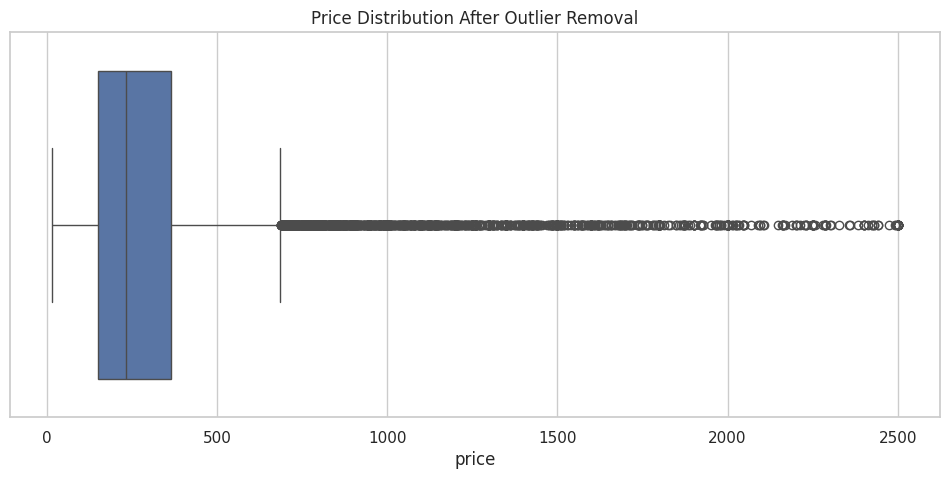


Price Statistics After Cleaning:
count    15386.000000
mean       324.727545
std        319.024870
min         16.000000
25%        151.000000
50%        232.000000
75%        365.000000
90%        620.000000
95%        944.750000
99%       1800.000000
max       2500.000000
Name: price, dtype: float64

=== AMENITIES PROCESSING ===


/tmp/ipython-input-10-3318414314.py:49: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




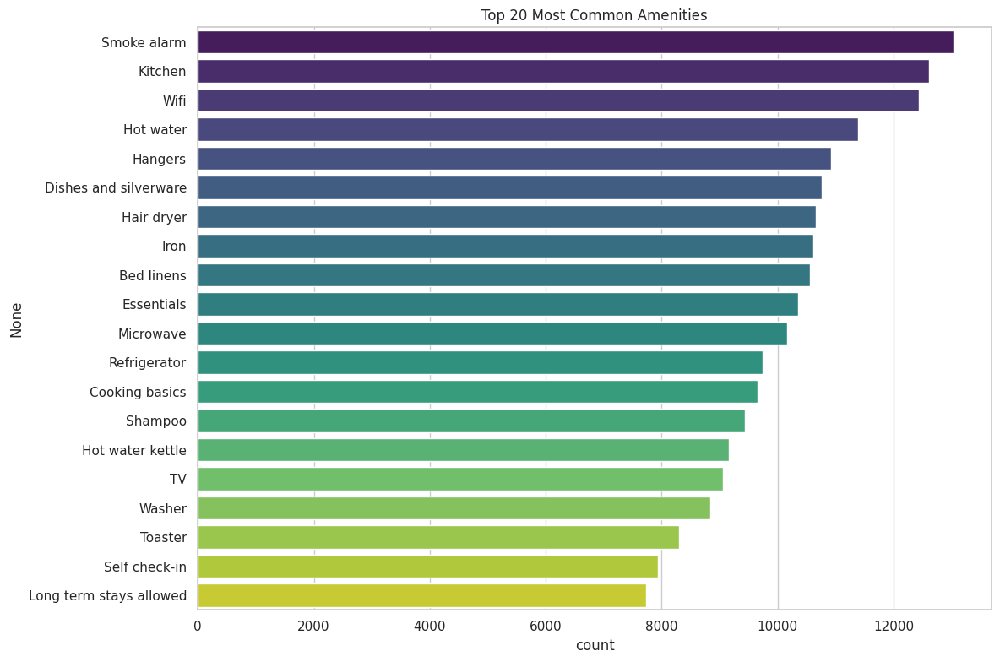


=== MISSING VALUE IMPUTATION ===

=== FINAL DATA VALIDATION ===

Remaining Missing Values:
id                                0
name                              0
host_id                           0
host_name                         0
host_since                        0
host_is_superhost                 0
neighbourhood                     0
host_neighbourhood                0
host_total_listings_count         0
latitude                          0
longitude                         0
property_type                     0
room_type                         0
accommodates                      0
bathrooms                         0
bedrooms                          0
beds                              0
amenities                         0
price                             0
minimum_nights                    0
maximum_nights                    0
availability_365                  0
number_of_reviews                 0
number_of_reviews_ltm             0
last_review                       0
host_res

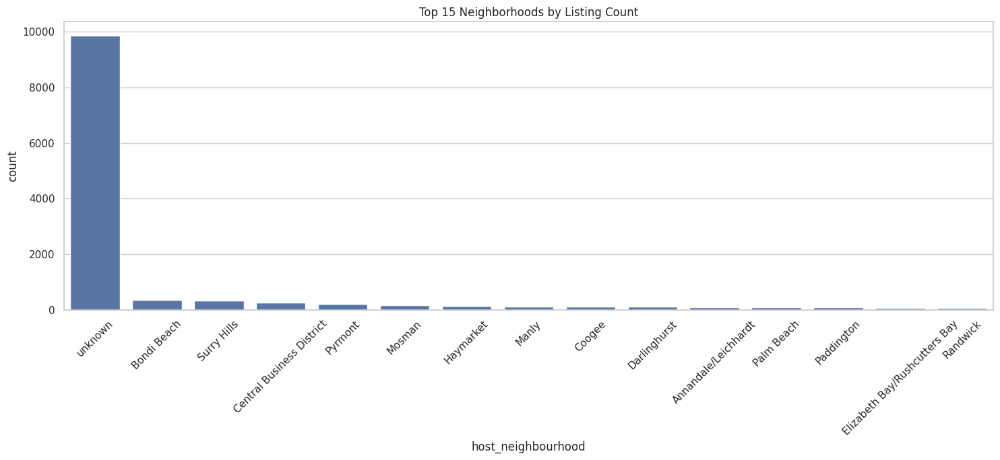


=== CLEANING PROCESS COMPLETE ===
Final Dataset Shape: (13686, 38)

--- Final Descriptive Statistics ---
                 id       host_id                     host_since  \
count  1.368600e+04  1.368600e+04                          13686   
mean   7.017464e+17  2.054345e+08  2017-12-23 20:59:52.108724224   
min    1.115600e+04  3.558200e+04            2009-09-02 00:00:00   
25%    4.092644e+07  3.202518e+07            2015-05-04 00:00:00   
50%    8.862770e+17  1.322882e+08            2017-05-28 00:00:00   
75%    1.195968e+18  3.399186e+08            2020-03-02 00:00:00   
max    1.367829e+18  6.818117e+08            2025-03-01 00:00:00   
std    5.394033e+17  2.002560e+08                            NaN   

       host_is_superhost  host_total_listings_count      latitude  \
count       13686.000000               13686.000000  13686.000000   
mean            0.314482                  48.062034    -33.855898   
min             0.000000                   0.000000    -34.132390   
25%  

In [10]:
# ======================
# DATA CLEANING PIPELINE
# ======================

# 1. Initial Setup
print("\n--- Initial Data Overview ---")
print(Sydney1.info())
print("\n--- Descriptive Statistics ---")
print(Sydney1.describe())

# 2. Outlier Treatment
print("\n=== OUTLIER HANDLING ===")

# Price Outliers
price_upper_limit = Sydney1['price'].quantile(0.99)
Sydney1 = Sydney1[Sydney1['price'] <= price_upper_limit].copy()

# Visual Validation
plt.figure(figsize=(12, 5))
sns.boxplot(x=Sydney1['price'])
plt.title('Price Distribution After Outlier Removal')
plt.show()

print("\nPrice Statistics After Cleaning:")
print(Sydney1['price'].describe(percentiles=[.25, .5, .75, .9, .95, .99]))

# Other Numeric Features
def remove_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

for col in ['beds', 'bedrooms', 'bathrooms']:
    Sydney1 = remove_outliers(Sydney1, col)

# 3. Amenities Processing
print("\n=== AMENITIES PROCESSING ===")
Sydney1['amenities'] = Sydney1['amenities'].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else [])

# Top Amenities Visualization
all_amenities = [amenity for sublist in Sydney1['amenities'] for amenity in sublist]
amenity_counts = Counter(all_amenities)
amenity_df = pd.DataFrame.from_dict(amenity_counts, orient='index', columns=['count']).sort_values('count', ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(x='count', y=amenity_df.index[:20], data=amenity_df[:20], palette='viridis')
plt.title('Top 20 Most Common Amenities')
plt.tight_layout()
plt.show()

# 4. Missing Value Imputation
print("\n=== MISSING VALUE IMPUTATION ===")

# Categorical Columns
for col in ['host_neighbourhood', 'neighbourhood', 'host_name']:
    Sydney1[col] = Sydney1[col].fillna('unknown')

# Boolean Columns
Sydney1['host_is_superhost'] = Sydney1['host_is_superhost'].fillna(
    Sydney1['host_is_superhost'].mode()[0]
)

# Numeric Columns
for col in ['bathrooms', 'bedrooms', 'beds']:
    Sydney1[col] = Sydney1[col].fillna(Sydney1[col].mode()[0])

# Review Scores
review_columns = ['review_scores_rating', 'review_scores_accuracy',
                 'review_scores_cleanliness', 'review_scores_checkin',
                 'review_scores_communication', 'review_scores_location',
                 'review_scores_value']

for col in review_columns:
    Sydney1[col] = Sydney1[col].fillna(Sydney1[col].median())

# Date Columns
for col in ['host_since', 'last_review']:
    Sydney1[col] = Sydney1[col].fillna(Sydney1[col].median())

# Other Numeric Columns
for col in ['host_total_listings_count', 'reviews_per_month',
           'host_response_rate', 'host_acceptance_rate']:
    if Sydney1[col].dtype == 'object':
        Sydney1[col] = Sydney1[col].astype(str).str.replace('%', '').astype(float) / 100
    Sydney1[col] = Sydney1[col].fillna(Sydney1[col].mode()[0])

# 5. Final Data Validation
print("\n=== FINAL DATA VALIDATION ===")

# Missing Values Check
print("\nRemaining Missing Values:")
print(Sydney1.isnull().sum().sort_values(ascending=False))

# Host Analysis
print("\n--- Host Information ---")
print(f"Date Range: {Sydney1['host_since'].min()} to {Sydney1['host_since'].max()}")
print(f"Superhost Distribution:\n{Sydney1['host_is_superhost'].value_counts()}")

# Neighborhood Analysis
plt.figure(figsize=(15, 7))
top_neighborhoods = Sydney1['host_neighbourhood'].value_counts().index[:15]
sns.countplot(x="host_neighbourhood", data=Sydney1, order=top_neighborhoods)
plt.title('Top 15 Neighborhoods by Listing Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("\n=== CLEANING PROCESS COMPLETE ===")
print(f"Final Dataset Shape: {Sydney1.shape}")
print("\n--- Final Descriptive Statistics ---")
print(Sydney1.describe())

##Geographic and Relationship Visualizations##

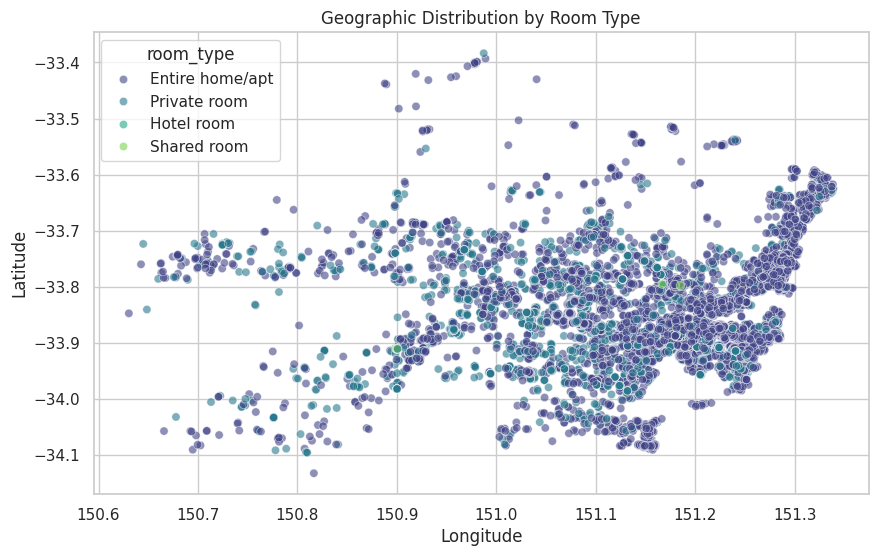

<Figure size 1000x600 with 0 Axes>

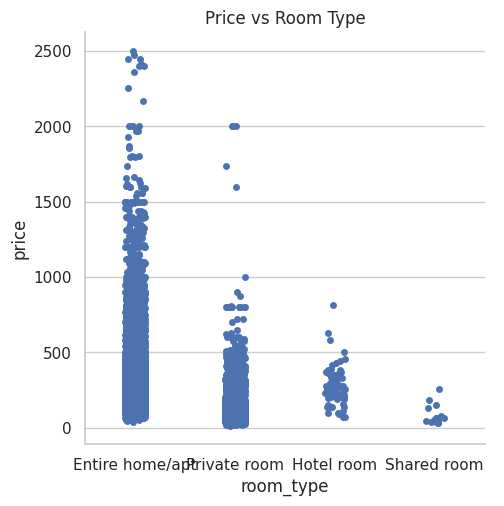

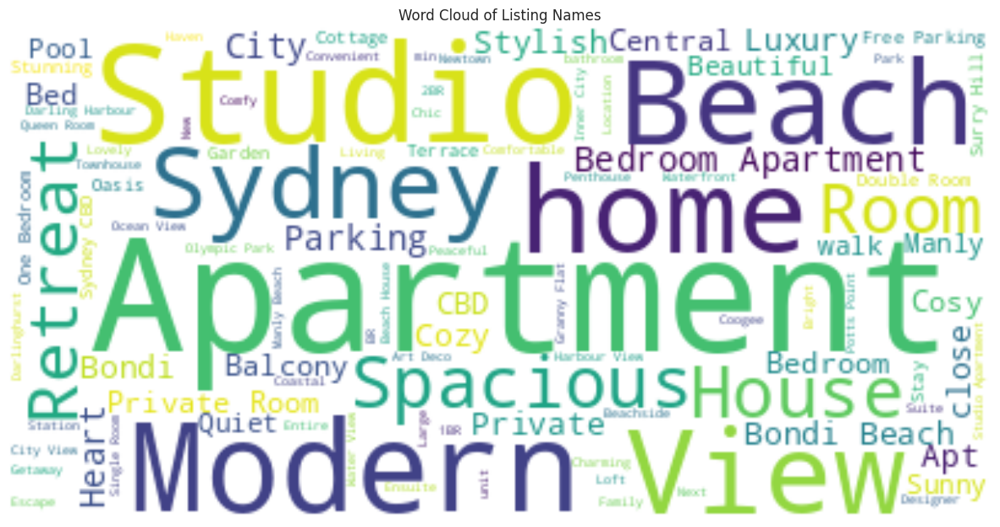


--- Property Type Distribution ---
property_type
Entire rental unit             6989
Entire home                    1748
Private room in home           1468
Private room in rental unit     825
Entire guesthouse               418
                               ... 
Private room in treehouse         1
Shared room in condo              1
Shared room in guest suite        1
Private room in yurt              1
Yurt                              1
Name: count, Length: 61, dtype: int64


/tmp/ipython-input-11-480868083.py:50: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




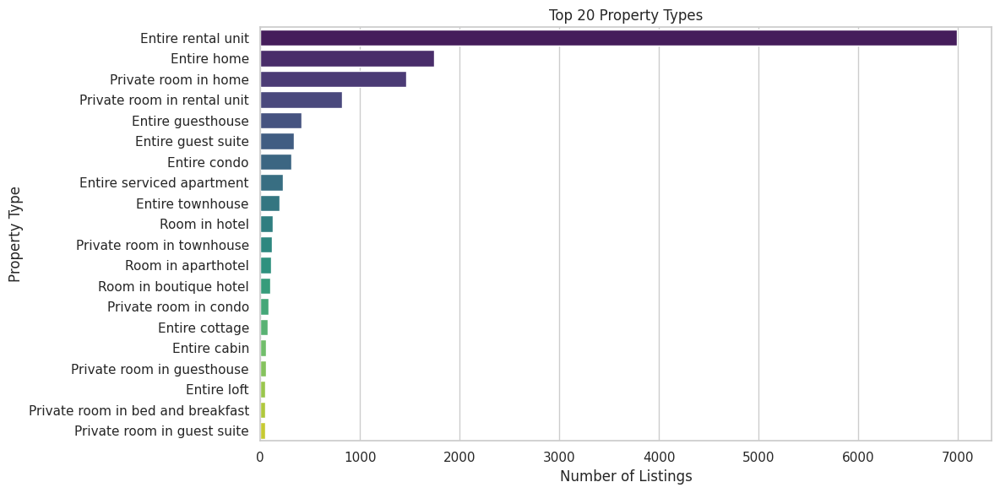

/tmp/ipython-input-11-480868083.py:73: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




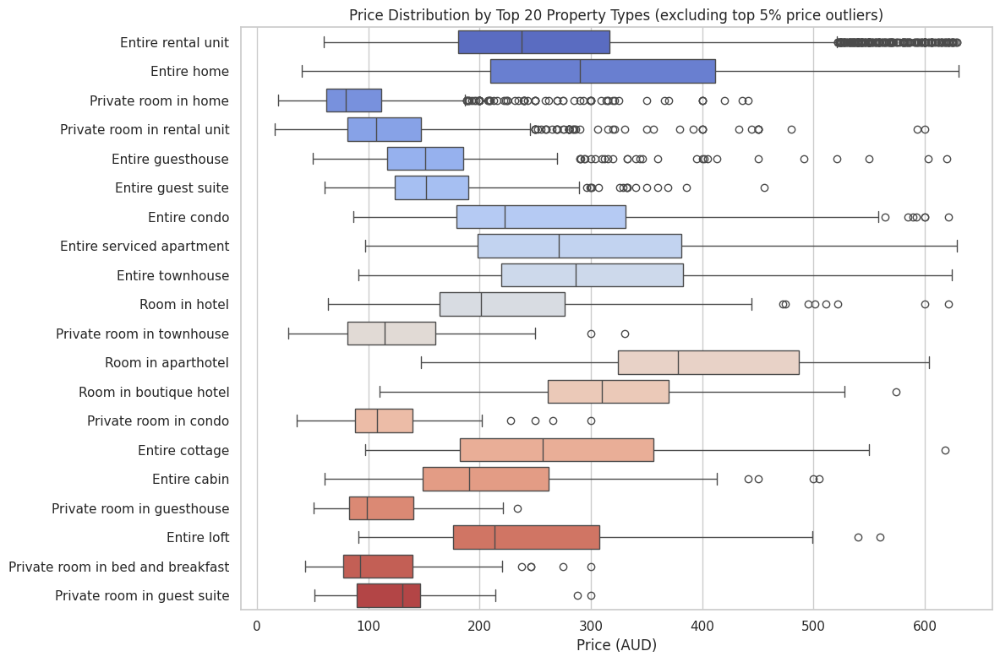


--- Room Type Breakdown by Property Type ---


room_type,Entire home/apt,Hotel room,Private room,Shared room,All
property_type,,,,,
All,10597,77,2993,19,13686
Entire rental unit,6989,0,0,0,6989
Entire home,1748,0,0,0,1748
Private room in home,0,0,1468,0,1468
Private room in rental unit,0,0,825,0,825
...,...,...,...,...,...
Shared room in bed and breakfast,0,0,0,1,1
Shared room in guest suite,0,0,0,1,1
Shared room in condo,0,0,0,1,1


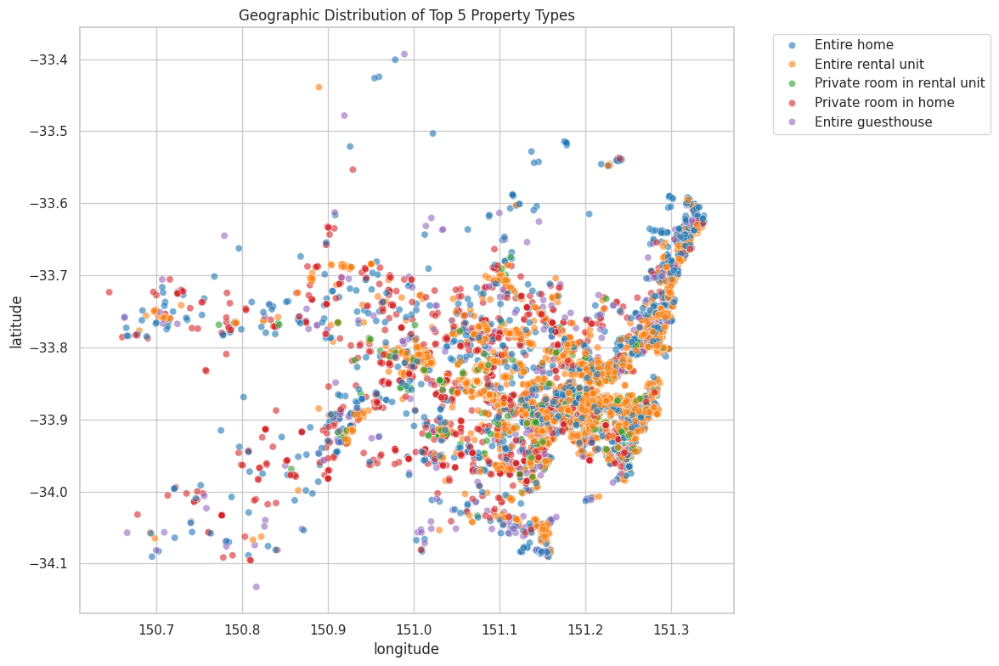


--- Price Statistics by Property Type ---
                              count        mean         std    min    25%  \
property_type                                                               
Entire rental unit           6989.0  285.437402  174.289416   60.0  184.0   
Entire home                  1748.0  429.987986  315.412829   40.0  227.0   
Private room in home         1468.0   95.918937   70.879533   19.0   62.0   
Private room in rental unit   825.0  140.875152  151.693395   16.0   81.0   
Entire guesthouse             418.0  167.906699   82.053374   50.0  117.0   
...                             ...         ...         ...    ...    ...   
Private room in yurt            1.0   78.000000         NaN   78.0   78.0   
Shared room in guest suite      1.0  149.000000         NaN  149.0  149.0   
Shared room in condo            1.0  260.000000         NaN  260.0  260.0   
Train                           1.0  135.000000         NaN  135.0  135.0   
Yurt                            1

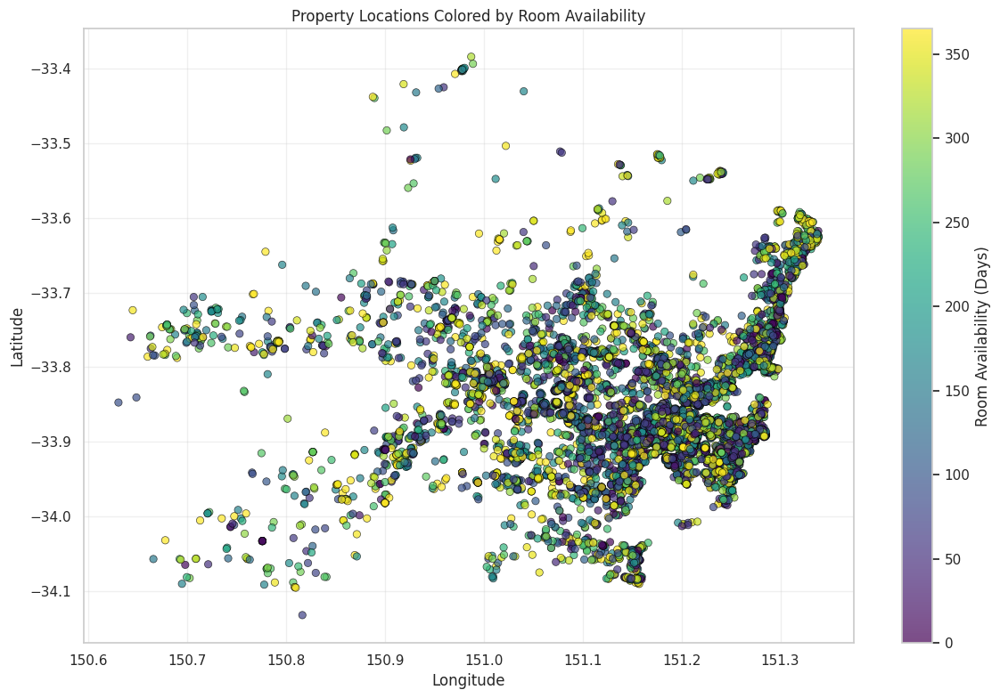

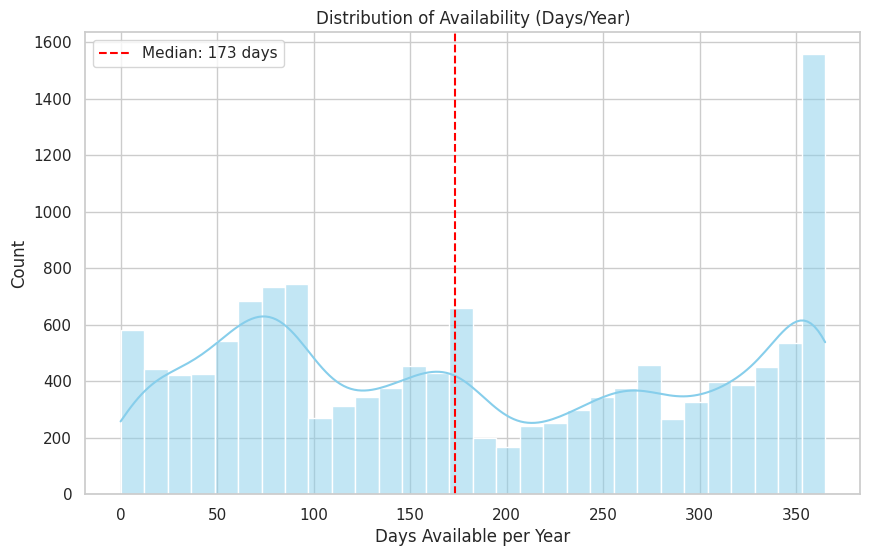

In [11]:
# Geographic distribution by room type
plt.figure(figsize=(10,6))
sns.scatterplot(
    x='longitude',
    y='latitude',
    hue='room_type',
    data=Sydney1,
    palette='viridis',
    alpha=0.6
)
plt.title('Geographic Distribution by Room Type')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

# Getting the room details (Donut Chart)
roomdf = Sydney1.groupby('room_type').size()/Sydney1['room_type'].count()*100
labels = roomdf.index
values = roomdf.values

# Use `hole` to create a donut-like pie chart
fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=.6)])
fig.update_layout(title_text='Distribution of Room Types')
fig.show()

# Catplot room type and price
plt.figure(figsize=(10,6))
sns.catplot(x="room_type", y="price", data=Sydney1);
plt.title('Price vs Room Type') # Add title to catplot
plt.ioff() # Turn off interactive mode, so plot doesn't show immediately if using it
plt.show() # Explicitly show the plot

# Word Cloud of Listing Names
text = " ".join(str(each) for each in Sydney1.name.dropna()) # Ensure no NaNs are passed
# Create and generate a word cloud image:
wordcloud = WordCloud(max_words=200, background_color="white").generate(text)
plt.figure(figsize=(15,10)) # Adjust figure size for better display
# Display the generated image:
plt.imshow(wordcloud, interpolation='Bilinear')
plt.axis("off")
plt.title('Word Cloud of Listing Names') # Add title
plt.show()

# Property Type Distribution
prop_type_counts = Sydney1['property_type'].value_counts(dropna=False)
print("\n--- Property Type Distribution ---")
print(prop_type_counts)

plt.figure(figsize=(12, 6))
sns.barplot(
    x=prop_type_counts.head(20).values,
    y=prop_type_counts.head(20).index,
    palette='viridis'
)
plt.title('Top 20 Property Types')
plt.xlabel('Number of Listings')
plt.ylabel('Property Type')
plt.tight_layout()
plt.show()

# Price Distribution by Top 20 Property Types (with outlier removal for visualization)
# Get top 20 property types by frequency
top_20_properties = Sydney1['property_type'].value_counts().nlargest(20).index

# Filter the data to include only top 20 property types and remove top 5% price outliers
filtered_data = Sydney1[
    (Sydney1['property_type'].isin(top_20_properties)) &
    (Sydney1['price'] <= Sydney1['price'].quantile(0.95))
]

# Create the plot
plt.figure(figsize=(12, 8))
sns.boxplot(
    y='property_type',
    x='price',
    data=filtered_data,
    palette='coolwarm',
    order=top_20_properties  # This ensures the property types are ordered by frequency
)
plt.title('Price Distribution by Top 20 Property Types (excluding top 5% price outliers)')
plt.ylabel('')
plt.xlabel('Price (AUD)')
plt.tight_layout()
plt.show()

# Room type breakdown by property type
print("\n--- Room Type Breakdown by Property Type ---")
display(pd.crosstab(
    Sydney1['property_type'],
    Sydney1['room_type'],
    margins=True
).sort_values('All', ascending=False))

# Geographic distribution by property type (Top 5)
if all(col in Sydney1.columns for col in ['latitude', 'longitude']):
    plt.figure(figsize=(12, 8))
    sns.scatterplot(
        x='longitude',
        y='latitude',
        hue='property_type',
        data=Sydney1[Sydney1['property_type'].isin(prop_type_counts.head(5).index)],
        palette='tab10',
        alpha=0.6
    )
    plt.title('Geographic Distribution of Top 5 Property Types')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left') # Adjust legend position
    plt.tight_layout()
    plt.show()

# Statistical summary by property type
print("\n--- Price Statistics by Property Type ---")
print(
    Sydney1.groupby('property_type')['price']
    .describe(percentiles=[.25, .5, .75, .9])
    .sort_values('count', ascending=False)
)

# Room availability heatmap
plt.figure(figsize=(12, 8))
scatter = plt.scatter(
    x=Sydney1['longitude'],
    y=Sydney1['latitude'],
    c=Sydney1['availability_365'],  # Color by room_availability
    cmap='viridis',
    edgecolor='black',
    linewidth=0.5,
    alpha=0.7
)

# Add colorbar
cbar = plt.colorbar(scatter)
cbar.set_label('Room Availability (Days)')

# Add titles and labels
plt.title('Property Locations Colored by Room Availability')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Distribution of Availability
plt.figure(figsize=(10, 6))
sns.histplot(
    Sydney1['availability_365'],
    bins=30,
    kde=True,
    color='skyblue'
)
plt.title('Distribution of Availability (Days/Year)')
plt.xlabel('Days Available per Year')
plt.ylabel('Count')
plt.axvline(
    Sydney1['availability_365'].median(),
    color='red',
    linestyle='--',
    label=f'Median: {Sydney1["availability_365"].median():.0f} days'
)
plt.legend()
plt.show()

##Data Quality Checks and Further Refinements ##


--- Sydney1 DataFrame Information after cleaning and imputation ---
<class 'pandas.core.frame.DataFrame'>
Index: 13686 entries, 0 to 18016
Data columns (total 38 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   id                              13686 non-null  int64         
 1   name                            13686 non-null  object        
 2   host_id                         13686 non-null  int64         
 3   host_name                       13686 non-null  object        
 4   host_since                      13686 non-null  datetime64[ns]
 5   host_is_superhost               13686 non-null  float64       
 6   neighbourhood                   13686 non-null  object        
 7   host_neighbourhood              13686 non-null  object        
 8   host_total_listings_count       13686 non-null  float64       
 9   latitude                        13686 non-null  float64       
 10  longit

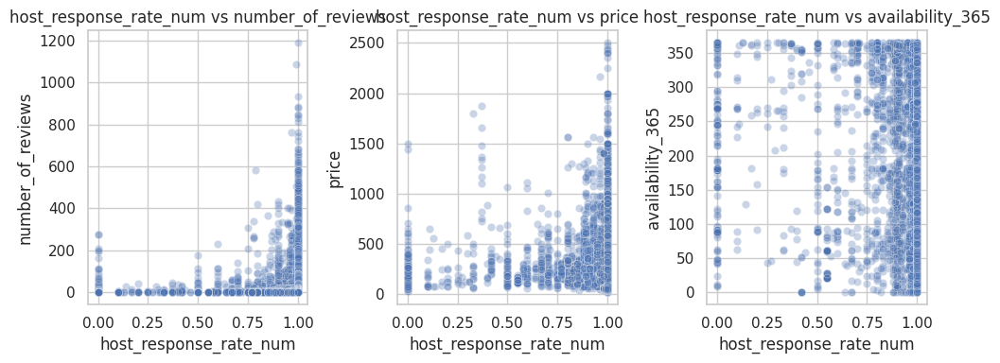

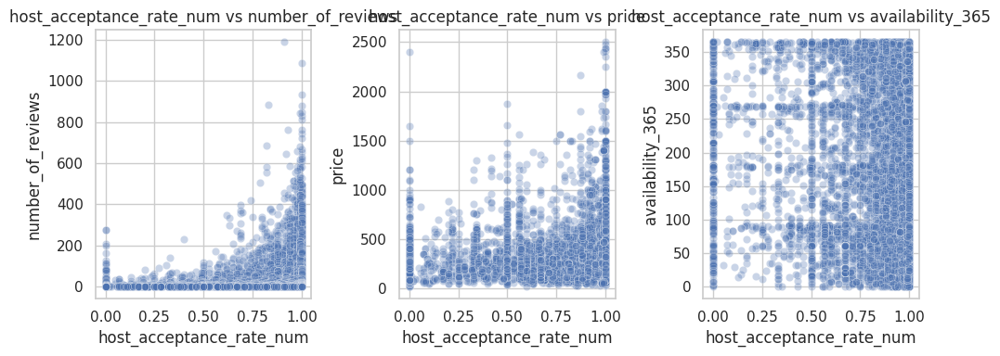


--- Data Quality Issues (Value Ranges) ---
Negative Prices: 0
Zero Accommodates: 0
Availability >365: 0
Bedrooms >20: 0
Bathrooms >10: 0

--- Listings with more than 10 bathrooms ---


,id,name,host_name,property_type,bathrooms,bedrooms,accommodates,price,latitude,longitude



--- Entries with invalid review scores (outside 1-10 range) ---
Number of listings with invalid review scores: 1

Review Score Columns Checked: ['review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 'review_scores_value']

--- Properties with initial capacity inconsistencies ---
Total properties with capacity inconsistencies: 400
Beds > Accommodates: 147
Bedrooms > Accommodates: 53
Bathrooms > Accommodates: 255

--- Capacity Correction Report ---
Corrected 147 beds values.
Corrected 53 bedrooms values.
Corrected 255 bathrooms values.

--- All capacity constraints validated successfully! ---


In [12]:
print("\n--- Sydney1 DataFrame Information after cleaning and imputation ---")
print(Sydney1.info())

# Host Since Analysis
print("\n=== Host Since ===")
print("Date Range:",
      Sydney1['host_since'].min().strftime('%Y-%m-%d'), "to",
      Sydney1['host_since'].max().strftime('%Y-%m-%d'))
print("Median Host Tenure:",
      (datetime.now() - Sydney1['host_since'].median()).days, "days")

# Last Review Analysis (with missing value handling)
print("\n=== Last Review ===")
if Sydney1['last_review'].notna().any():
    print("Date Range (non-null):",
          Sydney1['last_review'].min().strftime('%Y-%m-%d'), "to",
          Sydney1['last_review'].max().strftime('%Y-%m-%d'))
else:
    print("No valid review dates found")

print("Null Values:", Sydney1['last_review'].isna().sum())

# Review Date Consistency Check
active_without_reviews = Sydney1[
    (Sydney1['number_of_reviews'] > 0) &
    (Sydney1['last_review'].isna())
]

print("\n=== Data Quality Issues (Date) ===")
print(f"Listings with reviews but missing 'last_review' dates: {len(active_without_reviews)}")
print(f"Listings with future 'last_review' dates: {len(Sydney1[Sydney1['last_review'] > datetime.now()])}")

# Host Response Rate and Acceptance Rate Analysis
print("\n--- Host Response Rate Info ---")
print(Sydney1['host_response_rate'].info())
print("\n--- Host Response Rate Head ---")
print(Sydney1['host_response_rate'].head())
print("\n--- Host Response Rate Description ---")
print(Sydney1['host_response_rate'].describe())

print("\n--- Host Acceptance Rate Info ---")
print(Sydney1['host_acceptance_rate'].info())
print("\n--- Host Acceptance Rate Head ---")
print(Sydney1['host_acceptance_rate'].head())
print("\n--- Host Acceptance Rate Info (re-check) ---")
print(Sydney1['host_acceptance_rate'].info())

# Convert percentage strings to numeric (re-run in case previous imputation didn't handle it fully)
def convert_percentage(rate):
    if pd.isna(rate):
        return np.nan
    # Check if it's already a float (from previous imputation)
    if isinstance(rate, (float, int)):
        return float(rate)
    return float(str(rate).strip('%'))/100

Sydney1['host_response_rate_num'] = Sydney1['host_response_rate'].apply(convert_percentage)
Sydney1['host_acceptance_rate_num'] = Sydney1['host_acceptance_rate'].apply(convert_percentage)

# Check missingness correlation
missing_data_rates = Sydney1[['host_response_rate_num', 'host_acceptance_rate_num']].isnull()
print("\n--- Missing Value Correlation (Response/Acceptance Rates) ---")
print(missing_data_rates.corr())

# Compare superhost vs non-superhost
print("\n--- Missing rates by superhost status ---")
print(missing_data_rates.groupby(Sydney1['host_is_superhost']).mean())

# Comparative analysis with review scores
review_cols = ['review_scores_rating', 'review_scores_communication']
for rate in ['host_response_rate_num', 'host_acceptance_rate_num']:
    print(f"\n--- Correlation between {rate} and review scores ---")
    print(Sydney1[[rate] + review_cols].corr())

performance_metrics = ['number_of_reviews', 'price', 'availability_365']
for rate in ['host_response_rate_num', 'host_acceptance_rate_num']:
    plt.figure(figsize=(10,4))
    for i, metric in enumerate(performance_metrics):
        plt.subplot(1,3,i+1)
        sns.scatterplot(x=rate, y=metric, data=Sydney1, alpha=0.3)
        plt.title(f'{rate} vs {metric}')
    plt.tight_layout()
    plt.show()

# Value range validation
# Check for impossible values
issues = {
    'Negative Prices': len(Sydney1[Sydney1['price'] <= 0]),
    'Zero Accommodates': len(Sydney1[Sydney1['accommodates'] == 0]),
    'Availability >365': len(Sydney1[Sydney1['availability_365'] > 365]),
    'Bedrooms >20': len(Sydney1[Sydney1['bedrooms'] > 20]),
    'Bathrooms >10': len(Sydney1[Sydney1['bathrooms'] > 10])
}
print("\n--- Data Quality Issues (Value Ranges) ---")
for issue, count in issues.items():
    print(f"{issue}: {count}")

# Get listings with more than 10 bathrooms
luxury_bathrooms = Sydney1[Sydney1['bathrooms'] > 10]
print("\n--- Listings with more than 10 bathrooms ---")
display(luxury_bathrooms[[
    'id', 'name', 'host_name', 'property_type',
    'bathrooms', 'bedrooms', 'accommodates', 'price',
    'latitude', 'longitude'
]].sort_values('bathrooms', ascending=False))

# Review score validation
# All review scores should be between 1-10
review_cols_num = [c for c in Sydney1.columns if c.startswith('review_scores_') and c != 'reviews_per_month'] # Exclude reviews_per_month
invalid_reviews = Sydney1[(Sydney1[review_cols_num] < 1).any(axis=1) |
                             (Sydney1[review_cols_num] > 10).any(axis=1)]
print("\n--- Entries with invalid review scores (outside 1-10 range) ---")
print(f"Number of listings with invalid review scores: {len(invalid_reviews)}")

print("\nReview Score Columns Checked:", review_cols_num)

# Logical relationship (Capacity Consistency)
capacity_issues_df = Sydney1[
    (Sydney1['beds'] > Sydney1['accommodates']) |
    (Sydney1['bedrooms'] > Sydney1['accommodates']) |
    (Sydney1['bathrooms'] > Sydney1['accommodates'])
]
print("\n--- Properties with initial capacity inconsistencies ---")
print(f"Total properties with capacity inconsistencies: {len(capacity_issues_df)}")

# Breakdown of inconsistency types
print(f"Beds > Accommodates: {len(capacity_issues_df[capacity_issues_df['beds'] > capacity_issues_df['accommodates']])}")
print(f"Bedrooms > Accommodates: {len(capacity_issues_df[capacity_issues_df['bedrooms'] > capacity_issues_df['accommodates']])}")
print(f"Bathrooms > Accommodates: {len(capacity_issues_df[capacity_issues_df['bathrooms'] > capacity_issues_df['accommodates']])}")

def correct_capacity(df):
    """Corrects capacity inconsistencies where beds/bedrooms/bathrooms exceed accommodates."""
    original = df.copy()

    # Apply corrections for each column
    for col in ['beds', 'bedrooms', 'bathrooms']:
        # Only correct if the value is greater than accommodates
        mask = (df[col].notna()) & (df['accommodates'].notna()) & (df[col] > df['accommodates'])
        df.loc[mask, col] = df.loc[mask, 'accommodates']

    # Report changes
    print("\n--- Capacity Correction Report ---")
    for col in ['beds', 'bedrooms', 'bathrooms']:
        changed = (original[col] != df[col]).sum()
        print(f"Corrected {changed} {col} values.")

    return df

Sydney1 = correct_capacity(Sydney1)

def validate_capacity(df):
    """Validates if capacity issues remain after correction."""
    issues = {
        'beds': len(df[df['beds'] > df['accommodates']]),
        'bedrooms': len(df[df['bedrooms'] > df['accommodates']]),
        'bathrooms': len(df[df['bathrooms'] > df['accommodates']])
    }
    if any(issues.values()):
        print("\n--- Remaining issues after correction ---")
        for k, v in issues.items():
            print(f"{k}: {v}")
    else:
        print("\n--- All capacity constraints validated successfully! ---")

validate_capacity(Sydney1)

##Geographic Feature Engineering ##

In [13]:
import folium
from folium.plugins import HeatMap
import pandas as pd
import numpy as np
from geopy.distance import geodesic
from sklearn.neighbors import BallTree

# Create base map centered on Sydney
m = folium.Map(location=[-33.8688, 151.2093], zoom_start=11)

# Create heatmap layer
# Ensure 'latitude' and 'longitude' are not NaN for heatmap
heat_data = Sydney1[['latitude', 'longitude']].dropna().values.tolist()

HeatMap(
    heat_data,
    radius=8,
    blur=10,
    gradient={0.2: 'blue', 0.4: 'purple', 0.6: 'orange', 1.0: 'red'}
).add_to(m)

print("\n--- Interactive Heatmap of Listing Density in Sydney ---")
display(m)

# Distance to Sydney CBD (using Sydney Town Hall as reference point)
CBD_COORD = (-33.8738, 151.2069)

def calculate_distance(lat, lon, ref_point=CBD_COORD):
    """Calculate distance in kilometers from reference point."""
    if pd.isna(lat) or pd.isna(lon):
        return np.nan
    return geodesic((lat, lon), ref_point).km

# Add distance to CBD column
Sydney1['distance_to_cbd'] = Sydney1.apply(
    lambda x: calculate_distance(x['latitude'], x['longitude']), axis=1
)
print("\n--- Distance to CBD Head ---")
print(Sydney1['distance_to_cbd'].head())

# Distance to major Sydney landmarks
SYDNEY_LANDMARKS = {
    'sydney_airport': (-33.9399, 151.1753),
    'central_station': (-33.8832, 151.2066),
    'university_of_sydney': (-33.8884, 151.1873),
    'opera_house': (-33.8568, 151.2153),
    'bondi_beach': (-33.8915, 151.2767),
    'manly_beach': (-33.8000, 151.2887),
    'darling_harbour': (-33.8747, 151.1989),
    'taronga_zoo': (-33.8466, 151.2419)
}

# Calculate distances to each landmark
for name, coords in SYDNEY_LANDMARKS.items():
    Sydney1[f'distance_to_{name}'] = Sydney1.apply(
        lambda x: calculate_distance(x['latitude'], x['longitude'], coords), axis=1
    )
print("\n--- Distance to Landmarks Head ---")
print(Sydney1[['distance_to_sydney_airport', 'distance_to_opera_house', 'distance_to_bondi_beach']].head())

# Listing density features using BallTree
coords_for_tree = Sydney1[['latitude', 'longitude']].dropna()

if not coords_for_tree.empty:
    # Convert to radians for haversine metric
    coords_rad = np.deg2rad(coords_for_tree)
    tree = BallTree(coords_rad, metric='haversine')

    # Calculate listings within various radii
    for radius in [0.5, 1, 2, 5]:  # in kilometers
        rad_val = radius / 6371  # Convert km to radians
        listings = pd.Series(np.nan, index=Sydney1.index)
        listings.loc[coords_for_tree.index] = tree.query_radius(
            coords_rad, r=rad_val, count_only=True
        )
        Sydney1[f'listings_within_{radius}km'] = listings
        print(f"\nAdded listings within {radius}km radius")

    print("\n--- Listings Density Features Head ---")
    print(Sydney1[['listings_within_0.5km', 'listings_within_1km', 'listings_within_2km']].head())
else:
    print("Warning: No valid coordinates found for density calculations")

# Additional geographic features
def add_geographic_features(df):
    """Add derived geographic features"""
    # Coastal proximity flag (within 2km of major beaches)
    coastal_landmarks = ['bondi_beach', 'manly_beach']
    df['near_coast'] = df.apply(
        lambda x: any(x[f'distance_to_{lm}'] <= 2 for lm in coastal_landmarks
                      if not pd.isna(x[f'distance_to_{lm}'])), axis=1)

    # Transportation hub proximity
    df['near_transport_hub'] = df.apply(
        lambda x: x['distance_to_sydney_airport'] <= 10 or
                 x['distance_to_central_station'] <= 2, axis=1)

    # Tourist area flag
    tourist_landmarks = ['opera_house', 'darling_harbour', 'taronga_zoo']
    df['in_tourist_area'] = df.apply(
        lambda x: any(x[f'distance_to_{lm}'] <= 3 for lm in tourist_landmarks
                     if not pd.isna(x[f'distance_to_{lm}'])), axis=1)

    return df

Sydney1 = add_geographic_features(Sydney1)

print("\n--- Final DataFrame with Geographic Features ---")
print(Sydney1.info())
print("\n--- Sample of Geographic Features ---")
print(Sydney1[['distance_to_cbd', 'near_coast', 'near_transport_hub', 'in_tourist_area']].sample(5))


--- Interactive Heatmap of Listing Density in Sydney ---



--- Distance to CBD Head ---
0    27.432230
1     0.802475
2    19.909176
3     6.371875
4     1.804890
Name: distance_to_cbd, dtype: float64

--- Distance to Landmarks Head ---
   distance_to_sydney_airport  distance_to_opera_house  \
0                   35.323954                25.393753   
1                    7.434551                 2.598909   
2                   12.147024                21.926888   
3                    7.793999                 7.441235   
4                    9.235421                 1.501459   

   distance_to_bondi_beach  
0                27.825844  
1                 6.176715  
2                20.646632  
3                 3.368061  
4                 5.467222  

Added listings within 0.5km radius

Added listings within 1km radius

Added listings within 2km radius

Added listings within 5km radius

--- Listings Density Features Head ---
   listings_within_0.5km  listings_within_1km  listings_within_2km
0                   11.0                 44.0        

##Import##

In [14]:
pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 6.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=91328bc329310361e6acfbcf349326779ed3b1c2e6a938dea9e1334ea697e17d
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime


In [15]:
import folium
from folium.plugins import HeatMap
import geopandas as gpd
from shapely.geometry import Point
from libpysal.weights import DistanceBand
from scipy.stats import ttest_ind, f_oneway
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, RandomForestClassifier
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.feature_selection import VarianceThreshold
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.inspection import permutation_importance, PartialDependenceDisplay
import shap
import lime
import lime.lime_tabular
from datetime import datetime

##Initial Data Exploration and Preprocessing##

--- Initial Data Info ---
<class 'pandas.core.frame.DataFrame'>
Index: 13686 entries, 0 to 18016
Data columns (total 56 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   id                                13686 non-null  int64         
 1   name                              13686 non-null  object        
 2   host_id                           13686 non-null  int64         
 3   host_name                         13686 non-null  object        
 4   host_since                        13686 non-null  datetime64[ns]
 5   host_is_superhost                 13686 non-null  float64       
 6   neighbourhood                     13686 non-null  object        
 7   host_neighbourhood                13686 non-null  object        
 8   host_total_listings_count         13686 non-null  float64       
 9   latitude                          13686 non-null  float64       
 10  longitude                

/usr/local/lib/python3.11/dist-packages/seaborn/matrix.py:202: RuntimeWarning:

All-NaN slice encountered

/usr/local/lib/python3.11/dist-packages/seaborn/matrix.py:207: RuntimeWarning:

All-NaN slice encountered



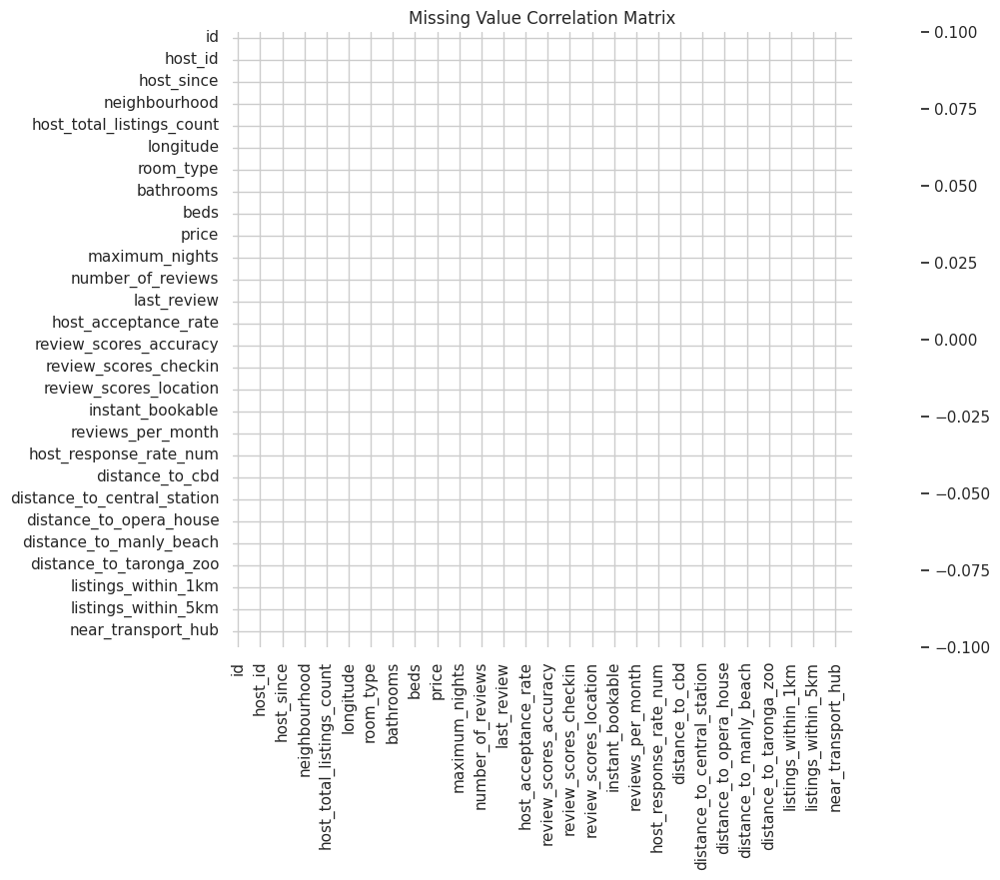


--- Host Superhost Status for Missing Host Neighbourhoods ---
Series([], Name: proportion, dtype: float64)

--- Host Neighbourhood Value Counts (after imputation) ---
host_neighbourhood
unknown                      9863
Bondi Beach                   349
Surry Hills                   323
Central Business District     253
Pyrmont                       207
                             ... 
Alphabet City                   1
Yarraville/Seddon               1
Marina District                 1
Monterey                        1
East Melbourne                  1
Name: count, Length: 175, dtype: int64


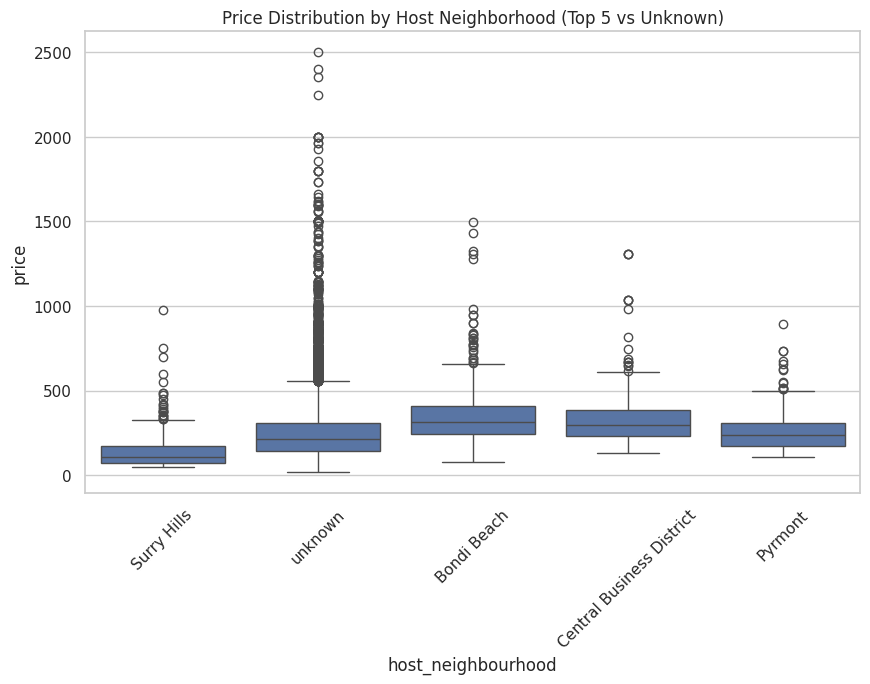


--- Superhost Rates by Host Neighbourhood ---
host_neighbourhood
Beaconsfield         1.0
Bardwell Valley      1.0
Castlecrag           1.0
Wolli Creek          1.0
Žižkov               1.0
Zilker               1.0
St Peters            1.0
Killarney Heights    1.0
Kogarah              1.0
Komalapuram          1.0
Name: host_is_superhost, dtype: float64

--- T-test p-value for Price (Known vs Unknown Host Neighbourhood): nan ---

--- Cross-tab: Host Neighbourhood vs Property Type ---


/usr/local/lib/python3.11/dist-packages/scipy/_lib/deprecation.py:234: SmallSampleWarning:

One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.



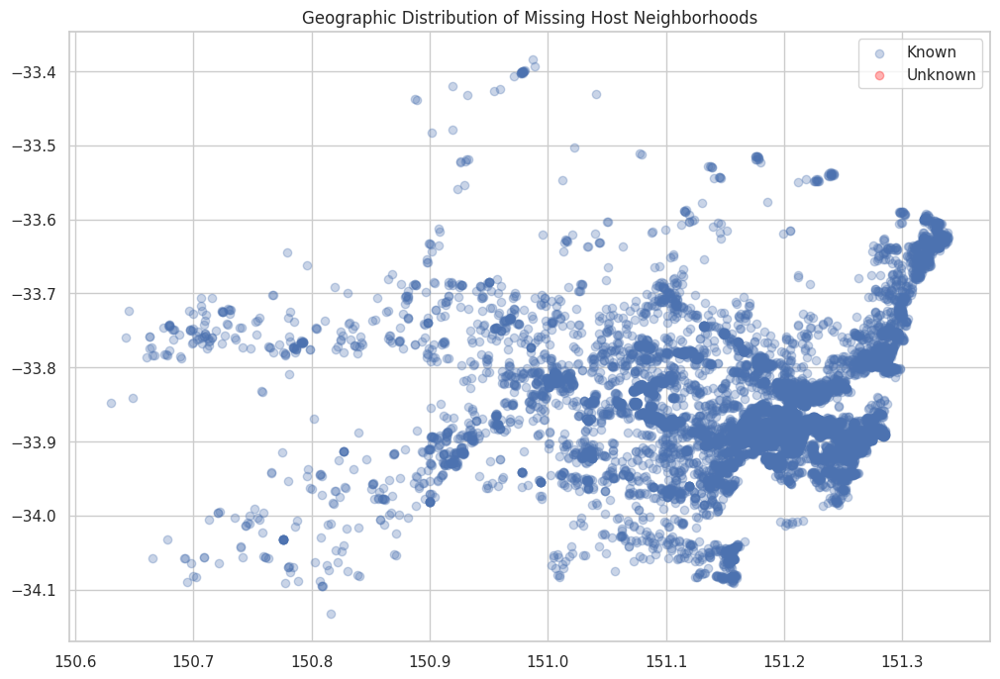

/tmp/ipython-input-16-4166987052.py:72: UserWarning:

Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.



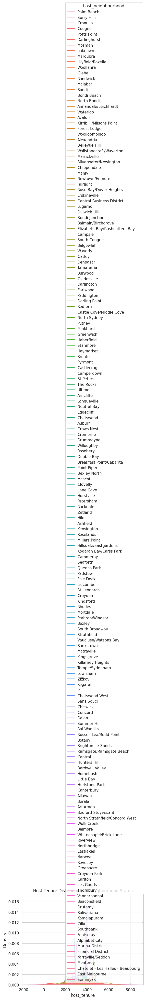

In [16]:
print("--- Initial Data Info ---")
print(Sydney1.info())

print("\n--- Descriptive Statistics for Distance and Listings ---")
print(Sydney1[['distance_to_cbd', 'listings_within_1km']].describe())

print("\n--- Host Neighbourhood Information ---")
print(Sydney1['host_neighbourhood'].info())
print(Sydney1['host_neighbourhood'].head())
print(Sydney1['host_neighbourhood'].describe())

# Check missingness patterns
print("\n--- Missing Value Correlation Matrix ---")
missing_corr = Sydney1.isnull().corr()
plt.figure(figsize=(10, 8))
sns.heatmap(missing_corr, cmap='coolwarm', center=0)
plt.title('Missing Value Correlation Matrix')
plt.show()

# Check if missingness is related to other variables
print("\n--- Host Superhost Status for Missing Host Neighbourhoods ---")
print(Sydney1[Sydney1['host_neighbourhood'].isnull()]['host_is_superhost'].value_counts(normalize=True))

# Create new column with missing indicator
Sydney1['host_neighbourhood'] = Sydney1['host_neighbourhood'].fillna('Unknown')

# Verify missing value imputation
print("\n--- Host Neighbourhood Value Counts (after imputation) ---")
print(Sydney1['host_neighbourhood'].value_counts(dropna=False))

# Price comparison for top 5 neighborhoods vs Unknown
plt.figure(figsize=(10, 6))
sns.boxplot(x='host_neighbourhood', y='price',
            data=Sydney1[Sydney1['host_neighbourhood'].isin(
                ['Unknown'] + list(Sydney1['host_neighbourhood'].value_counts().index[:5]))])
plt.xticks(rotation=45)
plt.title('Price Distribution by Host Neighborhood (Top 5 vs Unknown)')
plt.show()

# Superhost rate comparison
print("\n--- Superhost Rates by Host Neighbourhood ---")
superhost_rates = Sydney1.groupby('host_neighbourhood')['host_is_superhost'].mean().sort_values(ascending=False)
print(superhost_rates.head(10))

# T-test for price differences between known and unknown host neighborhoods
known_price = Sydney1[Sydney1['host_neighbourhood'] != 'Unknown']['price']
unknown_price = Sydney1[Sydney1['host_neighbourhood'] == 'Unknown']['price']

t_stat, p_value = ttest_ind(known_price, unknown_price, equal_var=False)
print(f"\n--- T-test p-value for Price (Known vs Unknown Host Neighbourhood): {p_value:.4f} ---")

# Cross-tab with property type
print("\n--- Cross-tab: Host Neighbourhood vs Property Type ---")
print(pd.crosstab(Sydney1['host_neighbourhood'],
                  Sydney1['property_type'],
                  normalize='index').style.background_gradient(cmap='Blues'))

# Geographic plot of known vs unknown
known = Sydney1[Sydney1['host_neighbourhood'] != 'Unknown']
unknown = Sydney1[Sydney1['host_neighbourhood'] == 'Unknown']

plt.figure(figsize=(12, 8))
plt.scatter(known['longitude'], known['latitude'], alpha=0.3, label='Known')
plt.scatter(unknown['longitude'], unknown['latitude'], alpha=0.3, c='red', label='Unknown')
plt.legend()
plt.title('Geographic Distribution of Missing Host Neighborhoods')
plt.show()

# Temporal analysis (if host_since available)
Sydney1['host_since'] = pd.to_datetime(Sydney1['host_since'])
Sydney1['host_tenure'] = (pd.to_datetime('today') - Sydney1['host_since']).dt.days
sns.kdeplot(data=Sydney1, x='host_tenure', hue='host_neighbourhood', common_norm=False)
plt.title('Host Tenure Distribution by Neighborhood Status')
plt.show()


##Neighbourhood analysis##

In [17]:
# Create working dataset with only known neighborhoods
known_neighborhoods = Sydney1[Sydney1['host_neighbourhood'] != 'Unknown'].copy()

# Top neighborhoods by listings count
print("\n--- Top 10 Neighborhoods by Listings Count ---")
top_neighborhoods = known_neighborhoods['host_neighbourhood'].value_counts().nlargest(10)
print(top_neighborhoods)

# Neighborhood performance metrics
print("\n--- Neighborhood Performance Metrics ---")
neighborhood_stats = known_neighborhoods.groupby('host_neighbourhood').agg({
    'price': ['median', 'count'],
    'review_scores_rating': 'median',
    'host_is_superhost': 'mean',
    'number_of_reviews': 'median'
}).sort_values(('price', 'median'), ascending=False)
print(neighborhood_stats.head(10).to_string())

# ANOVA test for price differences among top 5 neighborhoods
top_5_neigh = known_neighborhoods['host_neighbourhood'].value_counts().nlargest(5).index
groups_anova = [known_neighborhoods[known_neighborhoods['host_neighbourhood']==n]['price']
                for n in top_5_neigh]
f_stat_anova, p_value_anova = f_oneway(*groups_anova)
print(f"\n--- ANOVA p-value for price differences (Top 5 Neighborhoods): {p_value_anova:.4f} ---")


--- Top 10 Neighborhoods by Listings Count ---
host_neighbourhood
unknown                      9863
Bondi Beach                   349
Surry Hills                   323
Central Business District     253
Pyrmont                       207
Mosman                        153
Haymarket                     127
Manly                         123
Coogee                        108
Darlinghurst                  104
Name: count, dtype: int64

--- Neighborhood Performance Metrics ---
                    price       review_scores_rating host_is_superhost number_of_reviews
                   median count               median              mean            median
host_neighbourhood                                                                      
Les Gauds           685.0     1                 4.93          0.000000              61.0
Palm Beach          550.0    81                 4.82          0.234568               6.0
Central             540.0    29                 4.82          0.000000          

##Price prediction and feature importance##

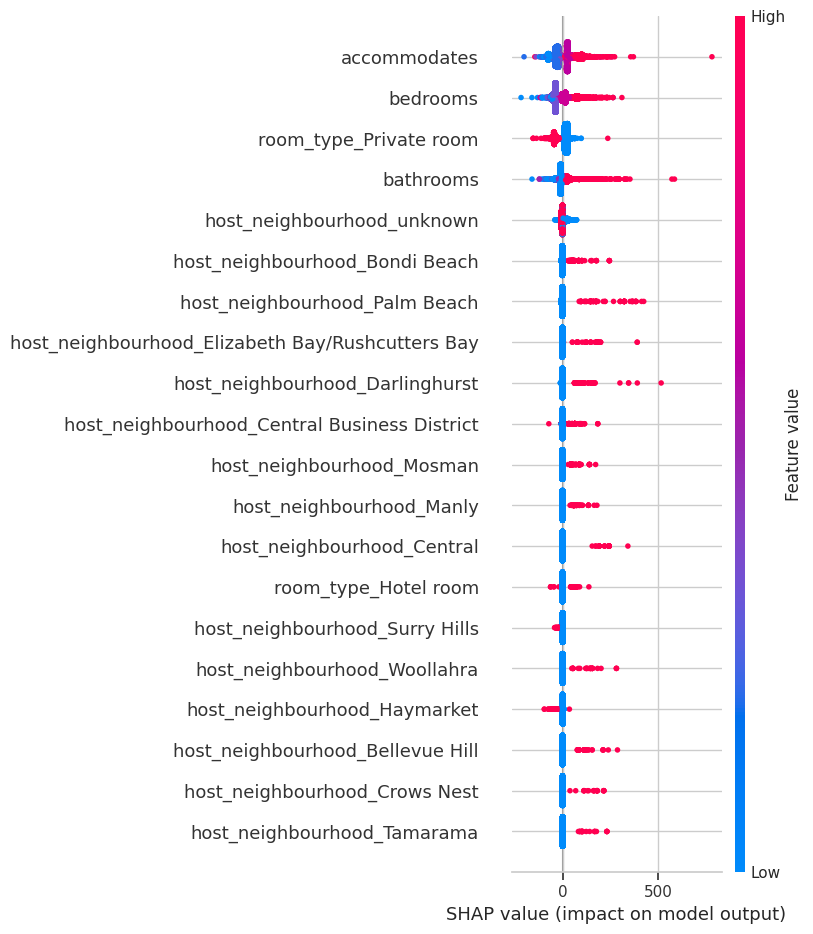

In [18]:
# Features for price prediction
features_price_pred = ['accommodates', 'bedrooms', 'bathrooms', 'host_neighbourhood', 'room_type']

# Ensure 'neighbourhood' is available in Sydney1 and handle it appropriately (e.g., one-hot encode)
# For simplicity, if 'neighbourhood' is categorical, ensure it's handled for get_dummies
if 'host_neighbourhood' in Sydney1.columns:
    X_price_pred = pd.get_dummies(Sydney1[features_price_pred].dropna(), columns=['host_neighbourhood', 'room_type'], drop_first=True)
else:
    features_price_pred = ['accommodates', 'bedrooms', 'bathrooms', 'room_type']
    X_price_pred = pd.get_dummies(Sydney1[features_price_pred].dropna(), columns=['room_type'], drop_first=True)

y_price_pred = Sydney1['price'].loc[X_price_pred.index] # Align target with features

# Train XGBoost model for SHAP analysis
xgb_model_shap = XGBRegressor(random_state=42)
xgb_model_shap.fit(X_price_pred, y_price_pred)

# SHAP analysis
explainer_shap = shap.TreeExplainer(xgb_model_shap)
shap_values = explainer_shap.shap_values(X_price_pred)
shap.summary_plot(shap_values, X_price_pred)


##Demand Forecasting##

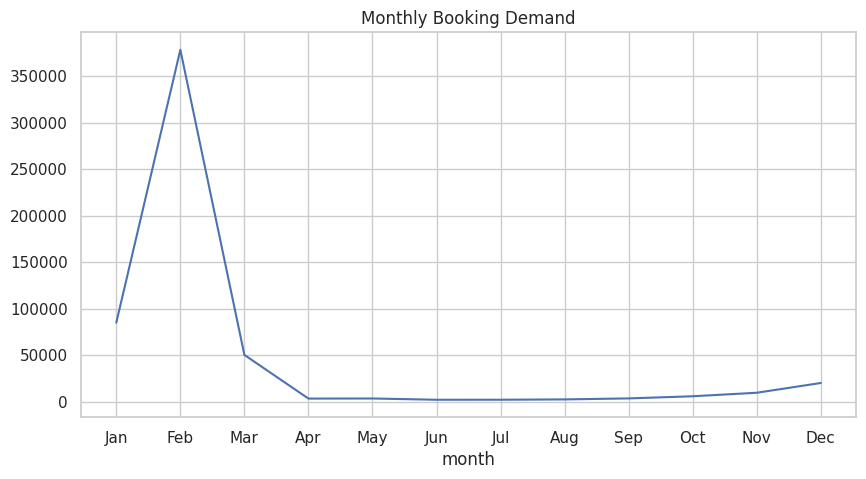

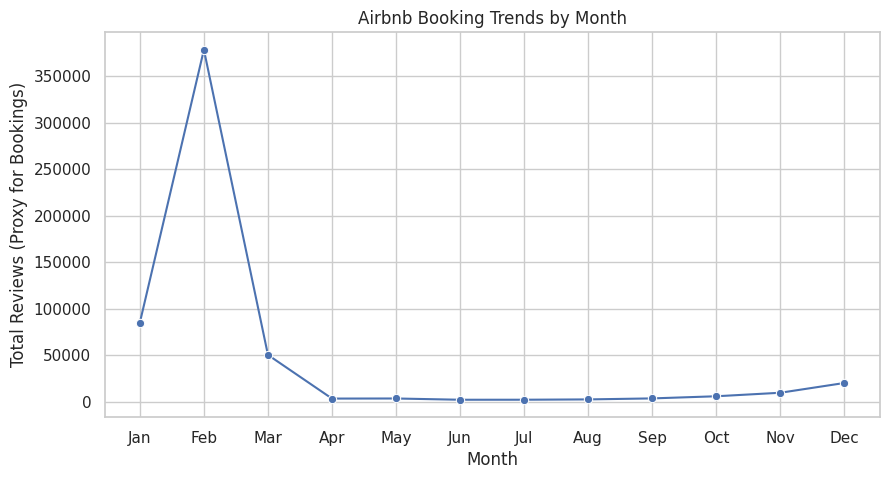


--- Seasonal Performance ---
   season  number_of_reviews
0  Autumn              57149
1  Spring              19063
2  Summer             483536
3  Winter               6722

--- Interactive Demand Map (displayed below) ---


In [19]:
# Seasonal demand visualization
Sydney1['last_review'] = pd.to_datetime(Sydney1['last_review'])
Sydney1['month'] = Sydney1['last_review'].dt.month
monthly_demand = Sydney1.groupby('month')['number_of_reviews'].sum()

plt.figure(figsize=(10, 5))
sns.lineplot(x=monthly_demand.index, y=monthly_demand.values)
plt.xticks(range(1,13), ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'])
plt.title('Monthly Booking Demand')
plt.show()

# Booking trends by month and season
Sydney1['review_month'] = Sydney1['last_review'].dt.month
Sydney1['review_year'] = Sydney1['last_review'].dt.year

seasonal_trends = Sydney1.groupby('review_month')['number_of_reviews'].sum().reset_index()

season_map = {
    1: 'Summer', 2: 'Summer', 3: 'Autumn',
    4: 'Autumn', 5: 'Autumn', 6: 'Winter',
    7: 'Winter', 8: 'Winter', 9: 'Spring',
    10: 'Spring', 11: 'Spring', 12: 'Summer'
}
seasonal_trends['season'] = seasonal_trends['review_month'].map(season_map)

plt.figure(figsize=(10, 5))
sns.lineplot(x='review_month', y='number_of_reviews', data=seasonal_trends, marker='o')
plt.title("Airbnb Booking Trends by Month")
plt.xlabel("Month")
plt.ylabel("Total Reviews (Proxy for Bookings)")
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid(True)
plt.show()

print("\n--- Seasonal Performance ---")
seasonal_performance = seasonal_trends.groupby('season')['number_of_reviews'].sum().reset_index()
print(seasonal_performance)

# Top neighborhoods by demand (number of reviews) and heatmap
neighborhood_demand = Sydney1.groupby('neighbourhood').agg({
    'number_of_reviews': 'sum',
    'latitude': 'mean',
    'longitude': 'mean'
}).reset_index()

top_neighborhoods_demand = neighborhood_demand.sort_values('number_of_reviews', ascending=False).head(20)

# Create Sydney map centered on CBD
sydney_map_demand = folium.Map(location=[-33.8688, 151.2093], zoom_start=12)

HeatMap(
    data=Sydney1[['latitude', 'longitude']].values,
    radius=15,
    blur=10,
).add_to(sydney_map_demand)

for idx, row in top_neighborhoods_demand.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=row['number_of_reviews'] / 500,
        color='blue',
        fill=True,
        fill_color='blue',
        popup=f"{row['neighbourhood']} (Reviews: {row['number_of_reviews']})"
    ).add_to(sydney_map_demand)

# sydney_map_demand.save('airbnb_demand_map.html')
print("\n--- Interactive Demand Map (displayed below) ---")
display(sydney_map_demand)



##Host Performance##

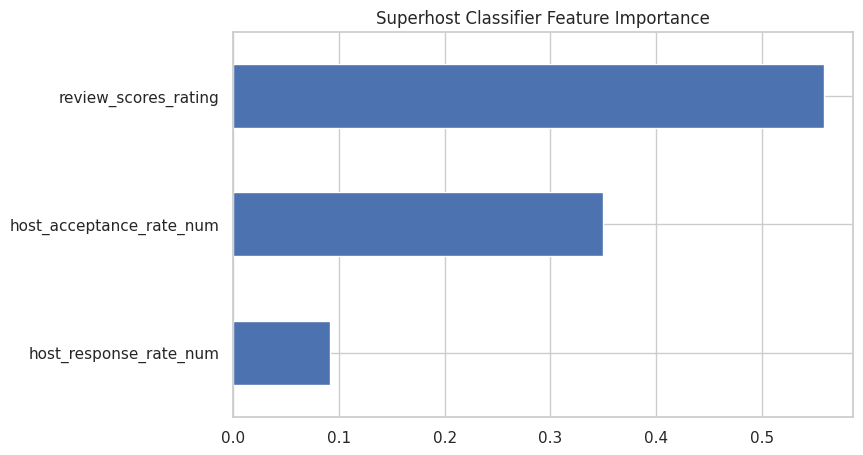

In [20]:
# Superhost classifier feature importance
X_superhost = Sydney1[['host_response_rate_num', 'host_acceptance_rate_num', 'review_scores_rating']].dropna()
y_superhost = Sydney1.loc[X_superhost.index]['host_is_superhost']

clf = RandomForestClassifier(random_state=42)
clf.fit(X_superhost, y_superhost)

plt.figure(figsize=(8, 5))
pd.Series(clf.feature_importances_, index=X_superhost.columns).plot(kind='barh')
plt.title('Superhost Classifier Feature Importance')
plt.show()

##Geographic Analysis##

In [21]:
# Interactive map with Folium (price heatmap)
sydney_map_price = folium.Map(location=[-33.8688, 151.2093], zoom_start=12)
heat_data = [[row['latitude'], row['longitude'], row['price']]
             for _, row in Sydney1.dropna(subset=['latitude', 'longitude', 'price']).iterrows()]
HeatMap(heat_data).add_to(sydney_map_price)
print("\n--- Interactive Price Heatmap (displayed below) ---")
display(sydney_map_price)

# Base map with CBD and top 50 properties by price
Syd_map = folium.Map(location=CBD_COORD, zoom_start=12)

folium.Marker(
    CBD_COORD,
    popup='Sydney CBD',
    icon=folium.Icon(color='red', icon='info-sign')
).add_to(Syd_map)

for _, row in Sydney1.nlargest(50, 'price').iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=3,
        color='blue',
        fill=True,
        popup=f"${row['price']}/night, {row['distance_to_cbd']:.1f}km to CBD"
    ).add_to(Syd_map)
print("\n--- Interactive Map with CBD and Top 50 Properties (displayed below) ---")
display(Syd_map)



--- Interactive Price Heatmap (displayed below) ---



--- Interactive Map with CBD and Top 50 Properties (displayed below) ---


##Operational Efficiency##

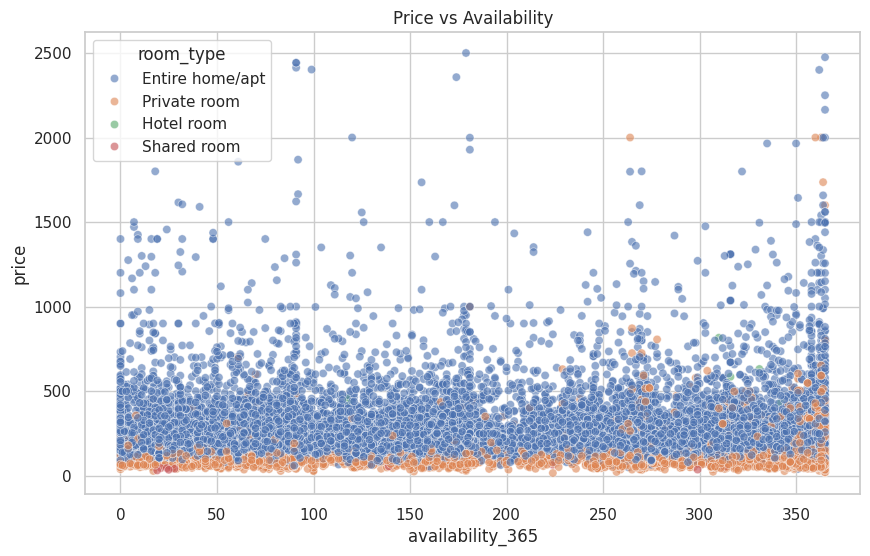

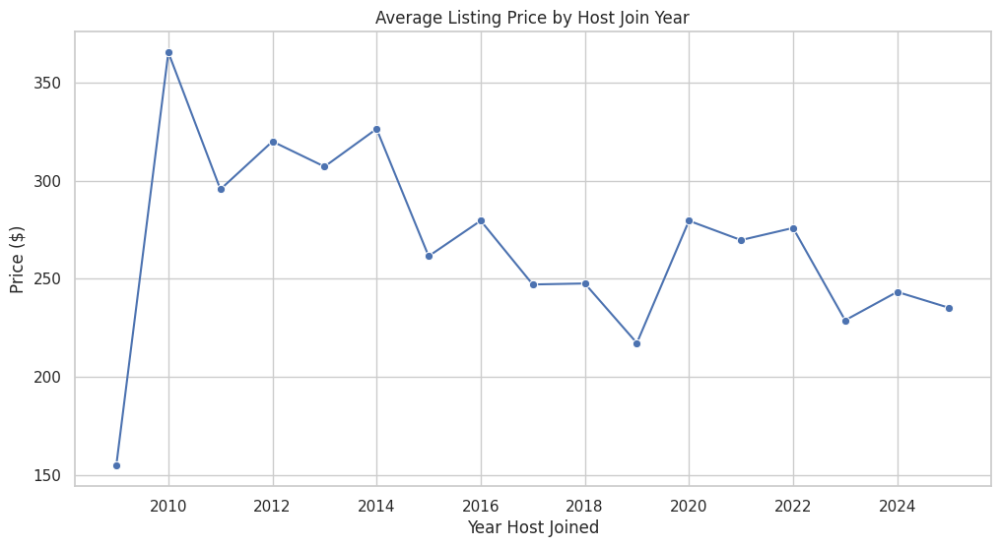

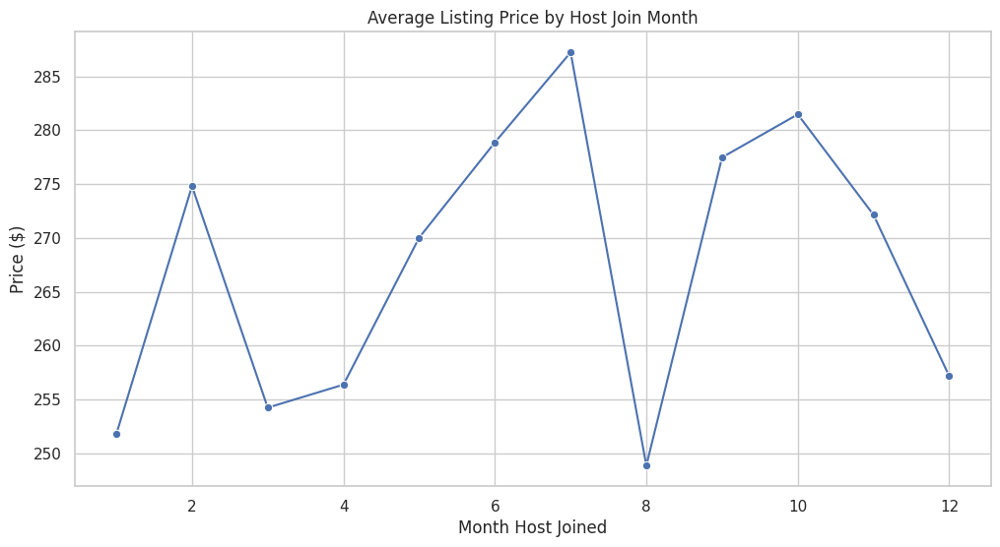

In [22]:
# Occupancy-Price tradeoff
plt.figure(figsize=(10, 6))
sns.scatterplot(x='availability_365', y='price',
                hue='room_type', data=Sydney1, alpha=0.6)
plt.title('Price vs Availability')
plt.show()

# Average Listing Price by Host Join Year
Sydney1['host_since_year'] = pd.to_datetime(Sydney1['host_since']).dt.year
plt.figure(figsize=(12,6))
sns.lineplot(
    x='host_since_year',
    y='price',
    data=Sydney1,
    estimator='mean',
    errorbar=None,
    marker='o'
)
plt.title('Average Listing Price by Host Join Year')
plt.xlabel('Year Host Joined')
plt.ylabel('Price ($)')
plt.grid(True)
plt.show()

# Average Listing Price by Host Join Month
Sydney1['host_since_month'] = pd.to_datetime(Sydney1['host_since']).dt.month
plt.figure(figsize=(12,6))
sns.lineplot(
    x='host_since_month',
    y='price',
    data=Sydney1,
    estimator='mean',
    errorbar=None,
    marker='o'
)
plt.title('Average Listing Price by Host Join Month')
plt.xlabel('Month Host Joined')
plt.ylabel('Price ($)')
plt.grid(True)
plt.show()


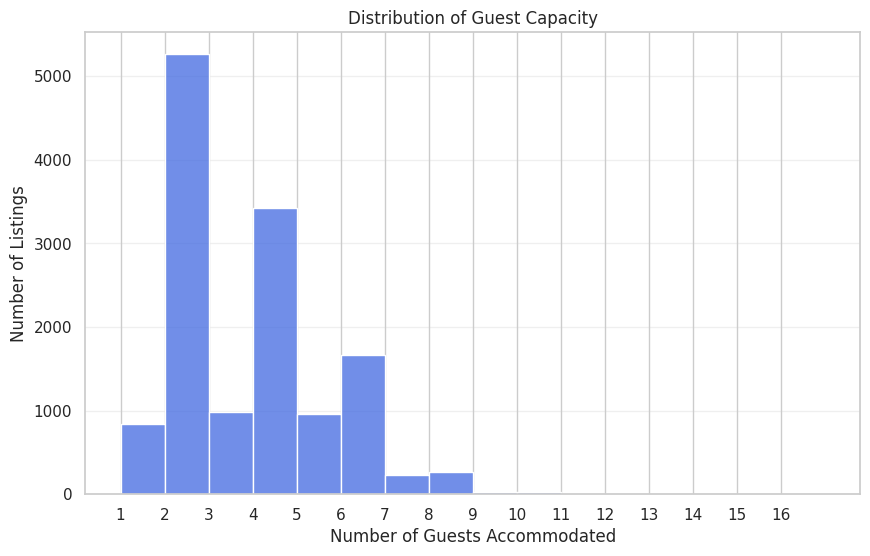

In [23]:
# Distribution of guest capacity
plt.figure(figsize=(10, 6))
sns.histplot(
    data=Sydney1,
    x='accommodates',
    bins=range(1, int(Sydney1['accommodates'].max())+2), # Ensure bins cover all integers
    kde=False,
    color='royalblue'
)
plt.title('Distribution of Guest Capacity')
plt.xlabel('Number of Guests Accommodated')
plt.ylabel('Number of Listings')
plt.xticks(range(1, int(Sydney1['accommodates'].max())+1))
plt.grid(axis='y', alpha=0.3)
plt.show()


##Spatial Analysis##

/usr/local/lib/python3.11/dist-packages/scipy/sparse/_data.py:128: RuntimeWarning:

divide by zero encountered in power

/usr/local/lib/python3.11/dist-packages/libpysal/weights/util.py:826: UserWarning:

The weights matrix is not fully connected: 
 There are 268 disconnected components.
 There are 105 islands with ids: 21, 442, 516, 545, 555, 614, 622, 1359, 1614, 1638, 1688, 1766, 2311, 2428, 2477, 2483, 2534, 2724, 3011, 3072, 3510, 3608, 3730, 3981, 3997, 4046, 4072, 4096, 4294, 4546, 4591, 4597, 4647, 4652, 4663, 4763, 5013, 5167, 5170, 5209, 5231, 5272, 5522, 5617, 5647, 5677, 5780, 5824, 5933, 5974, 6192, 6232, 6275, 6278, 6305, 6573, 6776, 6885, 6911, 7036, 7238, 7240, 7257, 7306, 7897, 7949, 7954, 8046, 8082, 8311, 8318, 8423, 8690, 8918, 9264, 9658, 9792, 9903, 9932, 9960, 10076, 10182, 10188, 10383, 10458, 10971, 11152, 11153, 11154, 11220, 11457, 11560, 11784, 12022, 12147, 12332, 12333, 12738, 12744, 12780, 13052, 13306, 13329, 13349, 13367.

/usr/local/lib/python3.11/dist

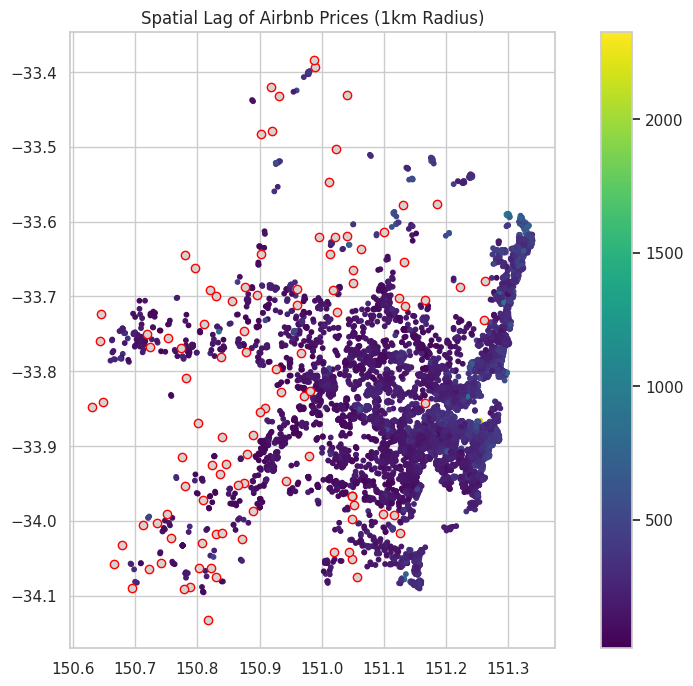


Spatial Lag Statistics:
count    13581.000000
mean       265.544375
std        115.698691
min         20.646762
25%        188.645582
50%        258.331233
75%        330.709029
max       2328.308140
Name: price_spatial_lag, dtype: float64


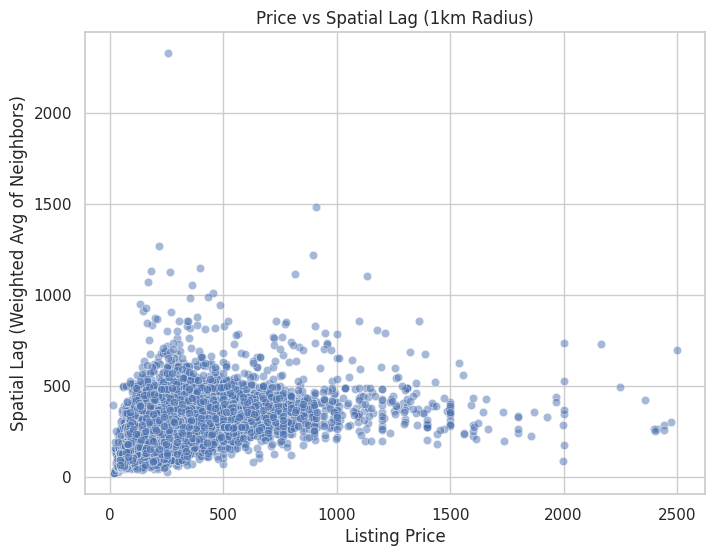

In [24]:
from libpysal.weights import DistanceBand
import geopandas as gpd
from shapely.geometry import Point
import numpy as np
import matplotlib.pyplot as plt

# Create GeoDataFrame
geometry = [Point(xy) for xy in zip(Sydney1['longitude'], Sydney1['latitude'])]
geo_df = gpd.GeoDataFrame(Sydney1, geometry=geometry, crs="EPSG:4326")

# Calculate spatial lag with decay
def spatial_lag_with_decay(gdf, value_col='price', threshold_km=1):
    """Calculate distance-weighted spatial lag"""
    threshold_deg = threshold_km / 111  # Approximate degrees per km

    # Prepare coordinates and values
    coords = list(zip(gdf['longitude'], gdf['latitude']))
    values = gdf[value_col].values

    # Create distance weights matrix
    try:
        w = DistanceBand(coords,
                        threshold=threshold_deg,
                        binary=False,
                        alpha=-1.5)  # alpha controls distance decay
    except:
        return np.full(len(gdf), np.nan)  # Return NaN if DistanceBand fails

    # Initialize output array
    lag_values = np.zeros(len(values))

    # Calculate weighted averages
    for i in range(len(values)):
        neighbors = w.neighbors[i]
        if neighbors:
            weights = np.array(w.weights[i])
            valid_mask = ~np.isnan(values[neighbors])
            if np.any(valid_mask):
                # Only use non-NaN neighbors
                lag_values[i] = np.sum(values[neighbors][valid_mask] * weights[valid_mask]) / np.sum(weights[valid_mask])
            else:
                lag_values[i] = np.nan
        else:
            lag_values[i] = np.nan

    return lag_values

# Apply spatial lag calculation
valid_price_mask = ~geo_df['price'].isna()
geo_df.loc[valid_price_mask, 'price_spatial_lag'] = spatial_lag_with_decay(
    geo_df[valid_price_mask],
    value_col='price',
    threshold_km=1
)

# Visualize spatial lag
fig, ax = plt.subplots(figsize=(12, 8))
geo_df.plot(
    column='price_spatial_lag',
    cmap='viridis',
    legend=True,
    markersize=10,
    ax=ax,
    missing_kwds={
        "color": "lightgrey",
        "edgecolor": "red",
        "label": "No Data"
    }
)
ax.set_title('Spatial Lag of Airbnb Prices (1km Radius)')
plt.show()

# Show descriptive statistics
print("\nSpatial Lag Statistics:")
print(geo_df['price_spatial_lag'].describe())

# Optional: Plot relationship between price and its spatial lag
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='price',
    y='price_spatial_lag',
    data=geo_df,
    alpha=0.5
)
plt.title('Price vs Spatial Lag (1km Radius)')
plt.xlabel('Listing Price')
plt.ylabel('Spatial Lag (Weighted Avg of Neighbors)')
plt.show()

In [25]:
Sydney1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 13686 entries, 0 to 18016
Data columns (total 62 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   id                                13686 non-null  int64         
 1   name                              13686 non-null  object        
 2   host_id                           13686 non-null  int64         
 3   host_name                         13686 non-null  object        
 4   host_since                        13686 non-null  datetime64[ns]
 5   host_is_superhost                 13686 non-null  float64       
 6   neighbourhood                     13686 non-null  object        
 7   host_neighbourhood                13686 non-null  object        
 8   host_total_listings_count         13686 non-null  float64       
 9   latitude                          13686 non-null  float64       
 10  longitude                         13686 non-null  f

##Review Analysis##

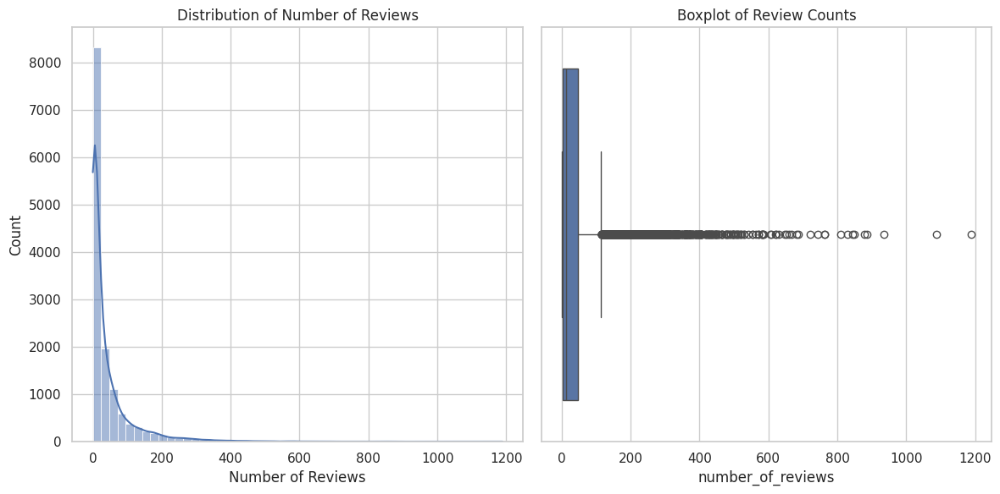


--- Statistical Summary of Number of Reviews ---
count    13686.000000
mean        41.390472
std         74.554783
min          0.000000
25%          2.000000
50%         13.000000
75%         47.000000
max       1189.000000
Name: number_of_reviews, dtype: float64


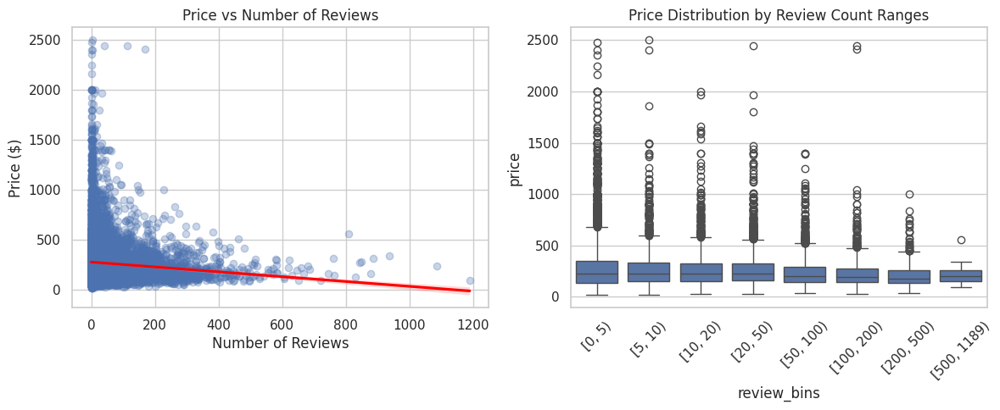

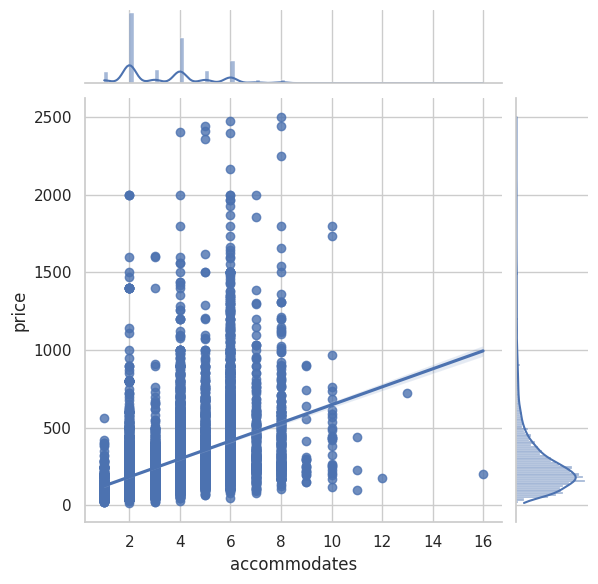

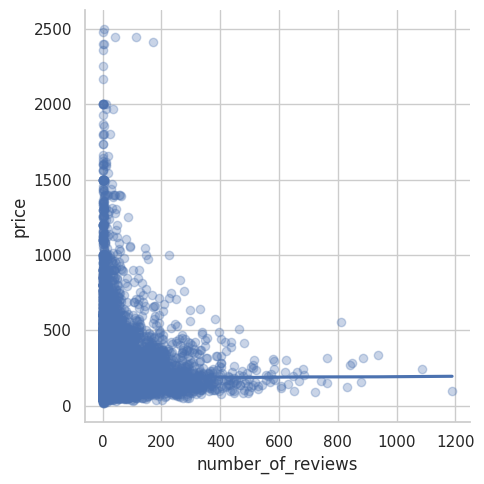

In [26]:
# Distribution of number of reviews
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.histplot(Sydney1['number_of_reviews'], bins=50, kde=True)
plt.title('Distribution of Number of Reviews')
plt.xlabel('Number of Reviews')

plt.subplot(1, 2, 2)
sns.boxplot(x=Sydney1['number_of_reviews'])
plt.title('Boxplot of Review Counts')
plt.tight_layout()
plt.show()

print("\n--- Statistical Summary of Number of Reviews ---")
print(Sydney1['number_of_reviews'].describe())

# Price vs Number of Reviews
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.regplot(x='number_of_reviews', y='price',
            data=Sydney1,
            scatter_kws={'alpha':0.3},
            line_kws={'color':'red'})
plt.title('Price vs Number of Reviews')
plt.xlabel('Number of Reviews')
plt.ylabel('Price ($)')

plt.subplot(1, 2, 2)
bins_reviews = [0, 5, 10, 20, 50, 100, 200, 500, Sydney1['number_of_reviews'].max()]
Sydney1['review_bins'] = pd.cut(Sydney1['number_of_reviews'], bins=bins_reviews, right=False)
sns.boxplot(x='review_bins', y='price', data=Sydney1)
plt.title('Price Distribution by Review Count Ranges')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Drill down into strong relationships (accommodates vs price)
sns.jointplot(x='accommodates', y='price', data=Sydney1, kind='reg')
plt.show()

# Check for nonlinear relationship (number_of_reviews vs price)
sns.lmplot(x='number_of_reviews', y='price',
           data=Sydney1,
           lowess=True,
           scatter_kws={'alpha':0.3})
plt.show()


##Feature Engineering and Selection##

In [27]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import statsmodels.api as sm
from sklearn.metrics import (r2_score, mean_absolute_error,
                            mean_squared_error, median_absolute_error,
                            explained_variance_score)
from scipy.stats import f_oneway
from sklearn.metrics import (r2_score, mean_absolute_error,
                           mean_squared_error, median_absolute_error,
                           explained_variance_score)
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.svm import SVR
from statsmodels.api import OLS, add_constant


=== Preparing Base Features ===

=== EVALUATING BASELINE FEATURES ===

Training OLS with Baseline features...
                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.302
Model:                            OLS   Adj. R-squared:                  0.302
Method:                 Least Squares   F-statistic:                     338.6
Date:                Thu, 03 Jul 2025   Prob (F-statistic):               0.00
Time:                        11:15:59   Log-Likelihood:                -71996.
No. Observations:               10948   AIC:                         1.440e+05
Df Residuals:                   10933   BIC:                         1.441e+05
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------

/tmp/ipython-input-28-613471849.py:92: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




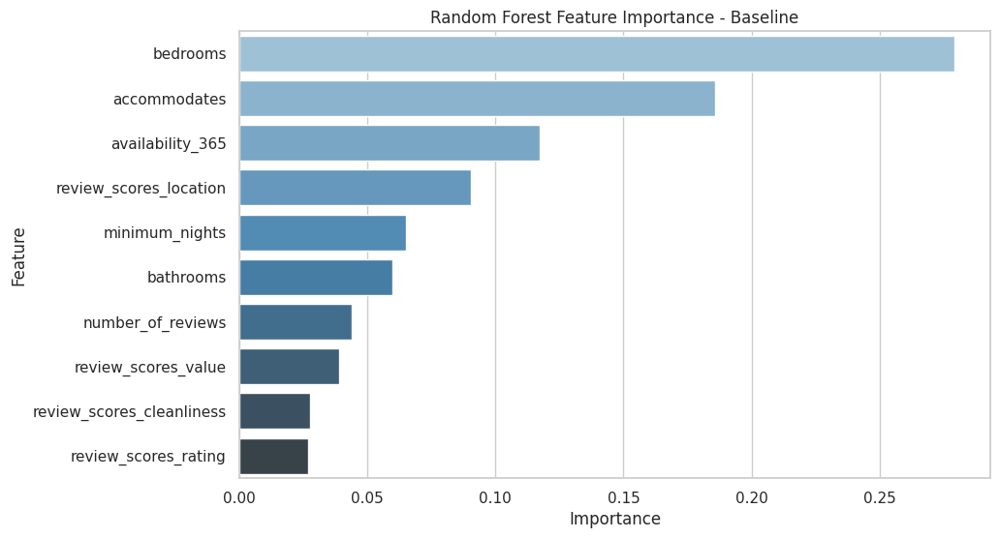


Training XGBoost with Baseline features...


/tmp/ipython-input-28-613471849.py:92: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




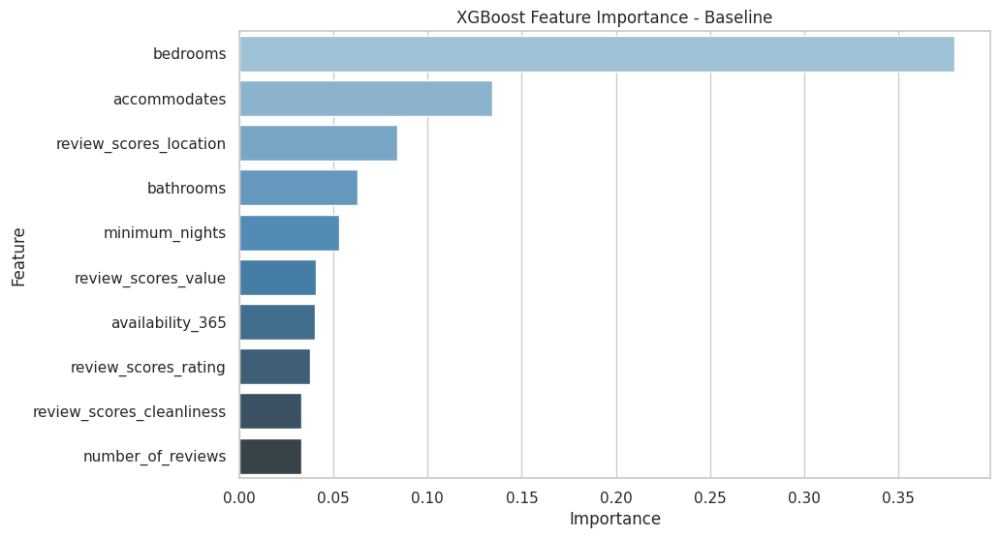


Training SVR with Baseline features...

=== EVALUATING +NEIGHBORHOOD FEATURES ===

Training OLS with +Neighborhood features...
                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.365
Model:                            OLS   Adj. R-squared:                  0.355
Method:                 Least Squares   F-statistic:                     34.81
Date:                Thu, 03 Jul 2025   Prob (F-statistic):               0.00
Time:                        11:16:21   Log-Likelihood:                -71480.
No. Observations:               10948   AIC:                         1.433e+05
Df Residuals:                   10769   BIC:                         1.446e+05
Df Model:                         178                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---

/tmp/ipython-input-28-613471849.py:92: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




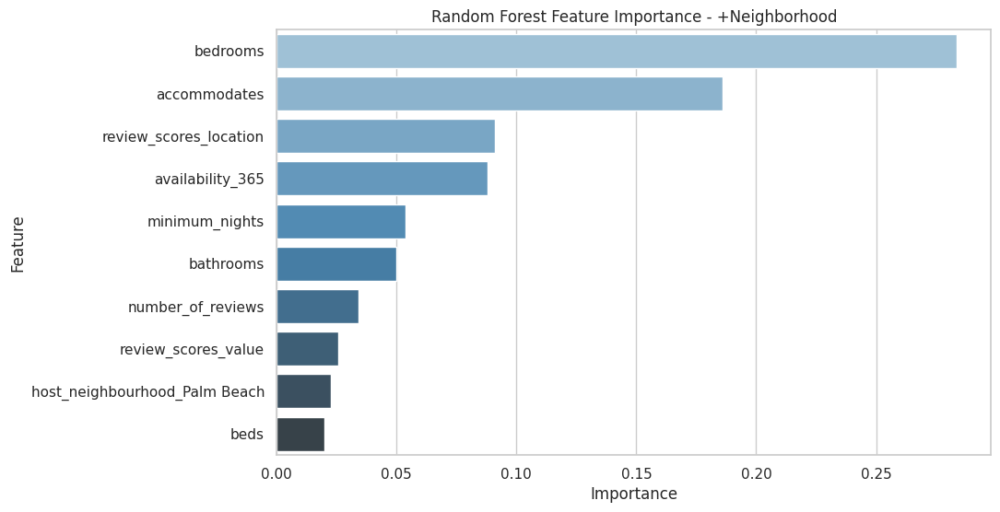


Training XGBoost with +Neighborhood features...


/tmp/ipython-input-28-613471849.py:92: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




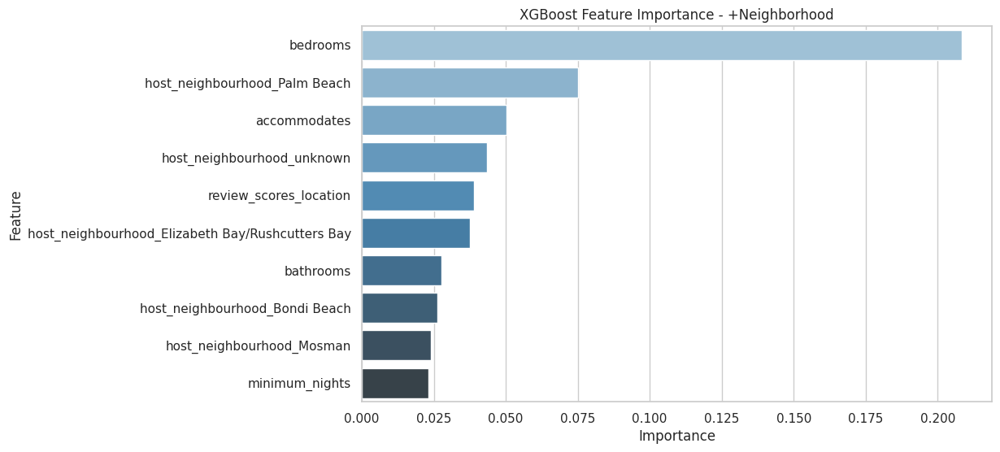


Training SVR with +Neighborhood features...

=== EVALUATING +HOST FEATURES ===

Training OLS with +Host features...
                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.305
Model:                            OLS   Adj. R-squared:                  0.304
Method:                 Least Squares   F-statistic:                     282.4
Date:                Thu, 03 Jul 2025   Prob (F-statistic):               0.00
Time:                        11:17:08   Log-Likelihood:                -71974.
No. Observations:               10948   AIC:                         1.440e+05
Df Residuals:                   10930   BIC:                         1.441e+05
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------

/tmp/ipython-input-28-613471849.py:92: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




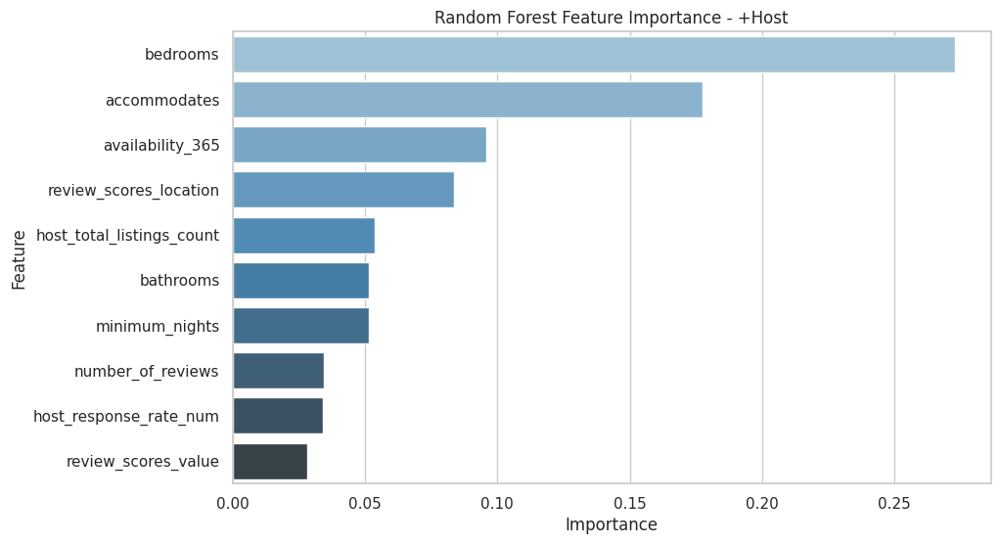


Training XGBoost with +Host features...


/tmp/ipython-input-28-613471849.py:92: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




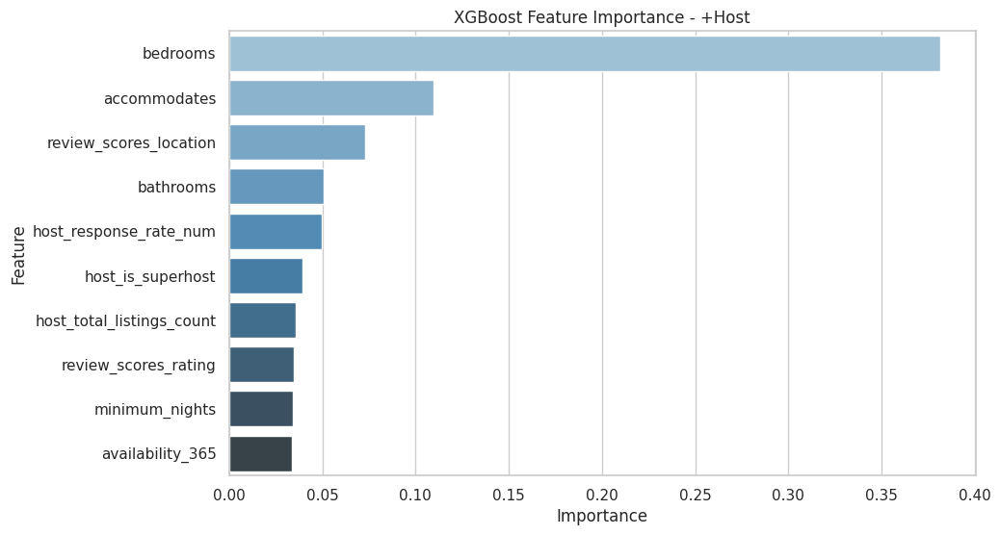


Training SVR with +Host features...

=== EVALUATING +GEOGRAPHIC FEATURES ===

Training OLS with +Geographic features...
                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.385
Model:                            OLS   Adj. R-squared:                  0.384
Method:                 Least Squares   F-statistic:                     402.2
Date:                Thu, 03 Jul 2025   Prob (F-statistic):               0.00
Time:                        11:17:27   Log-Likelihood:                -71308.
No. Observations:               10948   AIC:                         1.427e+05
Df Residuals:                   10930   BIC:                         1.428e+05
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
----------

/tmp/ipython-input-28-613471849.py:92: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




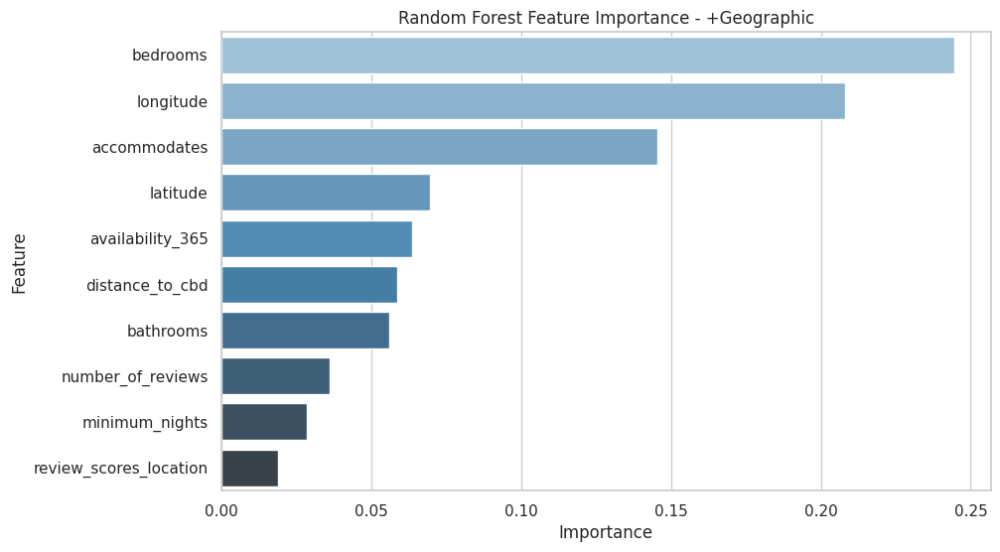


Training XGBoost with +Geographic features...


/tmp/ipython-input-28-613471849.py:92: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




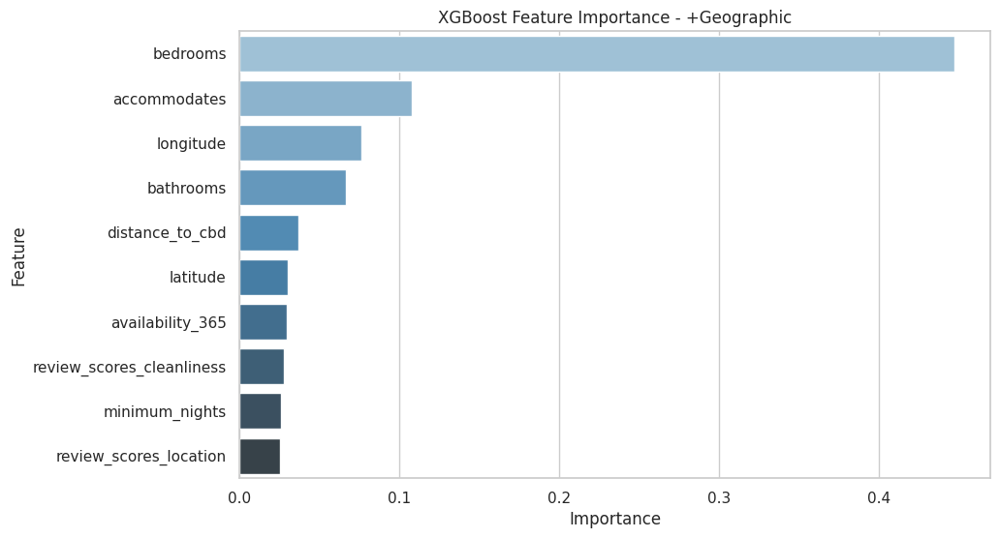


Training SVR with +Geographic features...

=== FINAL MODEL COMPARISON ===
                          Model  Test_R2  Test_Adj_R2  Test_MAE  Test_MSE  \
14          +Geographic XGBoost    0.513        0.510    82.751 25857.160   
13    +Geographic Random Forest    0.470        0.467    86.857 28165.144   
10                +Host XGBoost    0.431        0.428    93.446 30210.060   
6         +Neighborhood XGBoost    0.414        0.371    94.869 31144.452   
9           +Host Random Forest    0.395        0.392    98.117 32131.090   
5   +Neighborhood Random Forest    0.384        0.339    99.095 32734.544   
12              +Geographic OLS    0.366        0.362   104.365 33681.900   
1        Baseline Random Forest    0.357        0.354   101.396 34159.490   
2              Baseline XGBoost    0.346        0.343   100.117 34752.526   
4             +Neighborhood OLS    0.313        0.262   110.174 36508.546   
8                     +Host OLS    0.291        0.287   112.436 37652.407   
0

/tmp/ipython-input-28-613471849.py:158: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipython-input-28-613471849.py:158: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipython-input-28-613471849.py:158: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




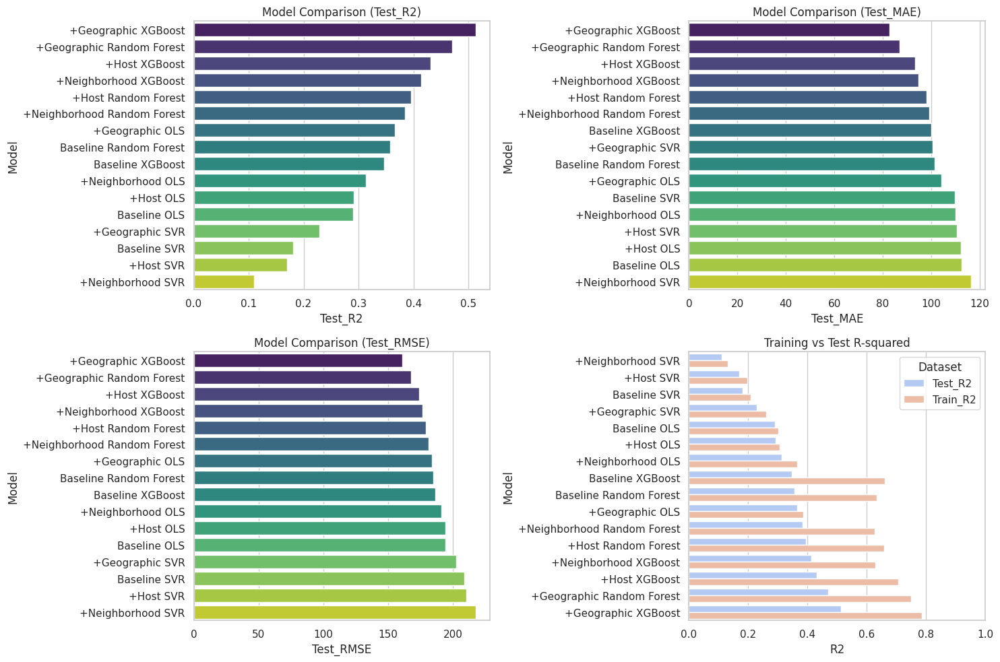


=== PIPELINE COMPLETE ===


In [28]:
# =============================================
# COMPREHENSIVE MODEL EVALUATION PIPELINE
# =============================================

# Initialize results storage
all_results = []

# Define comprehensive evaluation function
def evaluate_model_extended(name, model, X_train, X_test, y_train, y_test):
    """Extended evaluation with training metrics and statistics"""
    # Predictions
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Calculate metrics
    results = {
        'Model': name,
        # Training metrics
        'Train_R2': r2_score(y_train, y_train_pred),
        'Train_MAE': mean_absolute_error(y_train, y_train_pred),
        'Train_RMSE': np.sqrt(mean_squared_error(y_train, y_train_pred)),
        # Test metrics
        'Test_R2': r2_score(y_test, y_test_pred),
        'Test_MAE': mean_absolute_error(y_test, y_test_pred),
        'Test_RMSE': np.sqrt(mean_squared_error(y_test, y_test_pred)),
        # Additional statistics
        'Test_MSE': mean_squared_error(y_test, y_test_pred),
        'Test_MedAE': median_absolute_error(y_test, y_test_pred),
        'Test_Explained_Variance': explained_variance_score(y_test, y_test_pred)
    }

    # Calculate Adjusted R-squared
    n = X_test.shape[0]
    p = X_test.shape[1]
    results['Test_Adj_R2'] = 1 - (1 - results['Test_R2']) * (n - 1) / (n - p - 1)

    return results

def train_and_evaluate_models(X_train, X_test, y_train, y_test, feature_set_name=""):
    """Train and evaluate all model types on given feature set"""
    # Scale features
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    models = {
        'OLS': LinearRegression(),
        'Random Forest': RandomForestRegressor(
            n_estimators=200,
            max_depth=10,
            min_samples_split=5,
            random_state=42
        ),
        'XGBoost': XGBRegressor(
            n_estimators=200,
            max_depth=5,
            learning_rate=0.1,
            random_state=42
        ),
        'SVR': SVR(kernel='rbf', C=1.0, epsilon=0.1)
    }

    for name, model in models.items():
        print(f"\nTraining {name} with {feature_set_name} features...")
        model.fit(X_train_scaled, y_train)

        # Special handling for OLS to get statsmodels summary
        if name == 'OLS':
            X_train_sm = add_constant(X_train_scaled)
            sm_model = OLS(y_train, X_train_sm).fit()
            print(sm_model.summary())

        # Evaluate and store results
        result = evaluate_model_extended(
            f"{feature_set_name} {name}" if feature_set_name else name,
            model,
            X_train_scaled,
            X_test_scaled,
            y_train,
            y_test
        )
        all_results.append(result)

        # Show feature importance for tree-based models
        if name in ['Random Forest', 'XGBoost']:
            importance = pd.DataFrame({
                'Feature': X_train.columns,
                'Importance': model.feature_importances_
            }).sort_values('Importance', ascending=False)

            plt.figure(figsize=(10, 6))
            sns.barplot(x='Importance', y='Feature', data=importance.head(10), palette='Blues_d')
            plt.title(f'{name} Feature Importance - {feature_set_name}')
            plt.show()

# ======================
# MAIN PIPELINE
# ======================

# 1. Prepare base features
print("\n=== Preparing Base Features ===")
num_features_model = [
    col for col in [
        "host_is_superhost", "accommodates", "bathrooms", "bedrooms", "beds",
        "number_of_reviews", "availability_365", "minimum_nights", "review_scores_rating",
        "review_scores_location", "review_scores_cleanliness", "review_scores_checkin",
        "review_scores_communication", "review_scores_value"
    ] if col in Sydney1.columns
]

X_model = Sydney1[num_features_model].copy()
y_model = Sydney1["price"].copy()

# Handle missing values
X_model = X_model.fillna(X_model.median(numeric_only=True))

# 2. Create feature sets
feature_sets = {
    "Baseline": X_model,
    "+Neighborhood": pd.concat([X_model, pd.get_dummies(Sydney1[['host_neighbourhood']], drop_first=True)], axis=1),
    "+Host": pd.concat([X_model, Sydney1[['host_response_rate_num', 'host_acceptance_rate_num', 'host_total_listings_count']]], axis=1),
    "+Geographic": pd.concat([X_model, Sydney1[['latitude', 'longitude', 'distance_to_cbd']]], axis=1)
}

# Add spatial features if available
if 'price_spatial_lag' in Sydney1.columns:
    feature_sets["+Spatial"] = pd.concat([X_model, Sydney1[['price_spatial_lag']]], axis=1)

# 3. Train and evaluate models on each feature set
for feature_name, features in feature_sets.items():
    print(f"\n=== EVALUATING {feature_name.upper()} FEATURES ===")
    X_train, X_test, y_train, y_test = train_test_split(
        features, y_model, test_size=0.2, random_state=42
    )
    train_and_evaluate_models(X_train, X_test, y_train, y_test, feature_name)

# 4. Results analysis and visualization
results_comparison = pd.DataFrame(all_results)

# Reorder columns for better readability
metric_cols = ['Test_R2', 'Test_Adj_R2', 'Test_MAE', 'Test_MSE', 'Test_RMSE',
               'Train_R2', 'Train_MAE', 'Train_RMSE', 'Test_Explained_Variance']
results_comparison = results_comparison[['Model'] + metric_cols]

# Format for better display
pd.options.display.float_format = '{:.3f}'.format

print("\n=== FINAL MODEL COMPARISON ===")
print(results_comparison.sort_values('Test_R2', ascending=False))

# Visualization
plt.figure(figsize=(15, 10))

# Model performance comparison
metrics = ['Test_R2', 'Test_MAE', 'Test_RMSE']
for i, metric in enumerate(metrics, 1):
    plt.subplot(2, 2, i)
    sns.barplot(x=metric, y='Model', data=results_comparison.sort_values(metric, ascending=(metric != 'Test_R2')),
                palette='viridis')
    plt.title(f'Model Comparison ({metric})')

# Training vs Test comparison
plt.subplot(2, 2, 4)
melted = results_comparison.melt(id_vars=['Model'],
                               value_vars=['Train_R2', 'Test_R2'],
                               var_name='Dataset',
                               value_name='R2')
sns.barplot(x='R2', y='Model', hue='Dataset', data=melted.sort_values('R2'), palette='coolwarm')
plt.title('Training vs Test R-squared')
plt.xlim(0, 1)

plt.tight_layout()
plt.show()

print("\n=== PIPELINE COMPLETE ===")

##Correlation with Price##

In [29]:
numerical_data_corr = Sydney1.select_dtypes(include=['int64', 'float64'])
corr_matrix = numerical_data_corr.corr()

print("\n--- Top Features Correlated with Price ---")
price_corr = corr_matrix[['price']].sort_values('price', ascending=False)
print(price_corr)


--- Top Features Correlated with Price ---
                                  price
price                             1.000
accommodates                      0.473
bedrooms                          0.466
beds                              0.417
bathrooms                         0.372
longitude                         0.308
listings_within_0.5km             0.174
listings_within_1km               0.167
review_scores_location            0.160
listings_within_2km               0.156
listings_within_5km               0.133
host_tenure                       0.106
review_scores_rating              0.104
review_scores_cleanliness         0.098
latitude                          0.090
review_scores_accuracy            0.085
review_scores_checkin             0.062
review_scores_communication       0.053
host_total_listings_count         0.051
maximum_nights                    0.051
availability_365                  0.044
review_scores_value               0.027
host_response_rate_num            0.

##VIF Variance Inflation Factor for Multicollinearity##

In [ ]:
# =============================================
# ROBUST VIF ANALYSIS WITH DATA CLEANING
# =============================================

# 1. Handle Missing and Infinite Values
def clean_numeric_data(df):
    """Clean numeric data by handling missing and infinite values"""
    # Select numeric features
    numeric_data = df.select_dtypes(include=['int64', 'float64'])

    # Replace infinite values with NaN
    numeric_data = numeric_data.replace([np.inf, -np.inf], np.nan)

    # Impute missing values with median (more robust than mean)
    numeric_data = numeric_data.fillna(numeric_data.median())

    return numeric_data

# Clean the numeric data
numeric_data_clean = clean_numeric_data(Melbourne1)

# 2. VIF Calculation Function
def calculate_vif_safe(df, threshold=10):
    """Calculate VIF with proper error handling"""
    # Initialize results dataframe
    vif_data = pd.DataFrame()
    vif_data["Feature"] = df.columns

    # Calculate VIF for each feature
    vif_values = []
    for i in range(df.shape[1]):
        try:
            vif = variance_inflation_factor(df.values, i)
            vif_values.append(vif)
        except:
            # Handle cases where VIF can't be calculated
            vif_values.append(np.nan)

    vif_data["VIF"] = vif_values

    # Identify high VIF features
    high_vif = vif_data[vif_data["VIF"] > threshold].sort_values("VIF", ascending=False)

    return vif_data.sort_values("VIF", ascending=False), high_vif

# 3. Run VIF Analysis
vif_results, high_vif_features = calculate_vif_safe(numeric_data_clean.drop(['id', 'host_id'], axis=1))

print("\n=== VIF ANALYSIS RESULTS ===")
print(vif_results.round(1))
print("\n=== HIGH VIF FEATURES (>10) ===")
print(high_vif_features)

# 4. Feature Selection Based on VIF
def select_features_based_on_vif(df, vif_results, threshold=10, protected_features=None):
    """Select features while handling multicollinearity"""
    if protected_features is None:
        protected_features = ['price', 'host_is_superhost', 'review_scores_rating']

    # Get features to remove
    high_vif_cols = vif_results[vif_results["VIF"] > threshold]["Feature"].tolist()
    cols_to_remove = [col for col in high_vif_cols if col not in protected_features]

    print(f"\nRemoving {len(cols_to_remove)} high-VIF features: {cols_to_remove}")
    return df.drop(columns=cols_to_remove)

# Select final features
selected_features = select_features_based_on_vif(
    numeric_data_clean,
    vif_results,
    protected_features=['price']  # Keep price as we'll use it as target
)

print("\n=== SELECTED FEATURES ===")
print(selected_features.columns.tolist())

# 5. Final Data Preparation
def prepare_final_data(df, numeric_features, categorical_cols=None):
    """Prepare final dataset for modeling"""
    if categorical_cols is None:
        categorical_cols = ['property_type', 'room_type', 'neighbourhood']

    # Select numeric features
    X_numeric = df[numeric_features]

    # One-hot encode categorical features
    if categorical_cols:
        X_categorical = pd.get_dummies(df[categorical_cols], drop_first=True)
        X_final = pd.concat([X_numeric, X_categorical], axis=1)
    else:
        X_final = X_numeric

    return X_final

# Prepare final dataset
X_final = prepare_final_data(
    Melbourne1,
    numeric_features=selected_features.columns.tolist(),
    categorical_cols=['property_type', 'room_type']
)

print("\n=== FINAL DATASET SHAPE ===")
print(X_final.shape)


=== VIF ANALYSIS RESULTS ===
                                Feature         VIF
27               host_response_rate_num         inf
28             host_acceptance_rate_num         inf
15                 host_acceptance_rate         inf
14                   host_response_rate         inf
26                                 year  12946821.9
3                             longitude   8232364.7
2                              latitude   1229877.9
29                      distance_to_cbd    441808.0
33        distance_to_federation_square    367180.2
31   distance_to_southern_cross_station      6753.7
16                 review_scores_rating      1304.1
32  distance_to_university_of_melbourne      1272.1
17               review_scores_accuracy       877.4
22                  review_scores_value       759.1
20          review_scores_communication       743.6
21               review_scores_location       694.3
19                review_scores_checkin       521.1
18            review_scores_cleanl

##PCA Principal Component Analysis##

Explained variance ratio: [0.32910083 0.21615456 0.10237951 0.07312474 0.05477825 0.04970267
 0.04161907 0.03428622 0.03188185 0.01760787]
Total variance explained: 0.9506355647880982

Component Loadings:
                               PC1    PC2    PC3    PC4    PC5    PC6    PC7  \
host_is_superhost            0.140 -0.022 -0.521  0.311 -0.081  0.762 -0.031   
accommodates                 0.032  0.532 -0.058  0.067  0.030 -0.059 -0.222   
bathrooms                   -0.004  0.418  0.072 -0.020 -0.045  0.083  0.870   
bedrooms                     0.036  0.519  0.047  0.030  0.001  0.021 -0.085   
beds                         0.035  0.508 -0.057  0.106  0.070 -0.062 -0.365   
number_of_reviews            0.068 -0.080 -0.513  0.458  0.484 -0.487  0.185   
availability_365            -0.046 -0.055  0.323  0.767 -0.529 -0.142  0.004   
minimum_nights               0.000 -0.042  0.571  0.291  0.682  0.346 -0.018   
review_scores_rating         0.436 -0.015  0.046 -0.014 -0.041  0.033  0.04

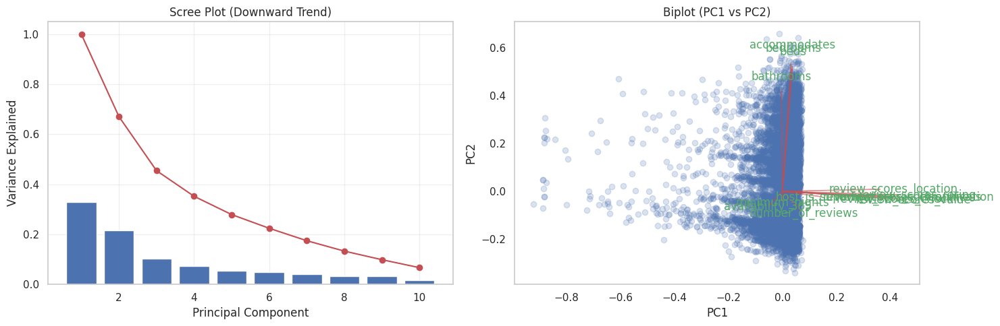


Components needed for:
80% variance: PC6
90% variance: PC8
95% variance: PC10


In [30]:
# Select and prepare features
features = [
       "host_is_superhost", "accommodates", "bathrooms", "bedrooms", "beds",
        "number_of_reviews", "availability_365", "minimum_nights", "review_scores_rating",
        "review_scores_location", "review_scores_cleanliness", "review_scores_checkin",
        "review_scores_communication", "review_scores_value"
]

X = Sydney1[features].fillna(Sydney1[features].median())

# Create and fit pipeline
pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('reducer', PCA(n_components=0.95))  # Keep 95% variance
])

pipe.fit(X)  # Fit the complete pipeline

# Get PCA results
pca = pipe.named_steps['reducer']
principal_components = pca.transform(pipe.named_steps['scaler'].transform(X))

# Create results DataFrame
pca_df = pd.DataFrame(
    data=principal_components,
    columns=[f'PC{i+1}' for i in range(pca.n_components_)]
)

# Variance analysis
print("Explained variance ratio:", pca.explained_variance_ratio_)
print("Total variance explained:", sum(pca.explained_variance_ratio_))

# Component loadings
loadings = pd.DataFrame(
    pca.components_.T,
    columns=[f'PC{i+1}' for i in range(pca.n_components_)],
    index=features
)
print("\nComponent Loadings:")
print(loadings)

# Visualization
plt.figure(figsize=(15, 5))

# Scree plot (modified to connect points properly)
plt.subplot(1, 2, 1)
bars = plt.bar(range(1, len(pca.explained_variance_ratio_)+1), pca.explained_variance_ratio_)

# Calculate cumulative variance points that connect to bar tops
cumulative_points = [1]  # Start at 100%
for i in range(len(pca.explained_variance_ratio_)):
    cumulative_points.append(cumulative_points[-1] - pca.explained_variance_ratio_[i])

# Plot connecting line
plt.plot(range(1, len(cumulative_points)), cumulative_points[:-1], 'ro-')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.title('Scree Plot (Downward Trend)')
plt.grid(alpha=0.3)

# Biplot
plt.subplot(1, 2, 2)
xs = principal_components[:,0]
ys = principal_components[:,1]
scalex = 1.0/(xs.max() - xs.min())
scaley = 1.0/(ys.max() - ys.min())

plt.scatter(xs * scalex, ys * scaley, alpha=0.2)

for i in range(len(features)):
    plt.arrow(0, 0, pca.components_[0,i], pca.components_[1,i],
              color='r', alpha=0.5)
    plt.text(pca.components_[0,i]*1.15, pca.components_[1,i]*1.15,
             features[i], color='g', ha='center', va='center')

plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title('Biplot (PC1 vs PC2)')
plt.grid()
plt.tight_layout()
plt.show()

# Numerical summary
print(f"\nComponents needed for:")
print(f"80% variance: PC{(np.cumsum(pca.explained_variance_ratio_) >= 0.80).argmax() + 1}")
print(f"90% variance: PC{(np.cumsum(pca.explained_variance_ratio_) >= 0.90).argmax() + 1}")
print(f"95% variance: PC{(np.cumsum(pca.explained_variance_ratio_) >= 0.95).argmax() + 1}")

##Model Interpretability XAI##


--- Permutation Importance ---
                      Feature  Importance   Std
15                  longitude      38.264 0.987
1                accommodates      21.354 0.561
3                    bedrooms      14.406 0.538
16            distance_to_cbd      10.799 0.527
14                   latitude       6.514 0.293
2                   bathrooms       4.425 0.353
6            availability_365       4.274 0.430
9      review_scores_location       3.081 0.252
10  review_scores_cleanliness       2.105 0.310
13        review_scores_value       1.913 0.252

Creating PDP for: ['longitude', 'accommodates', 'bedrooms', 'distance_to_cbd']


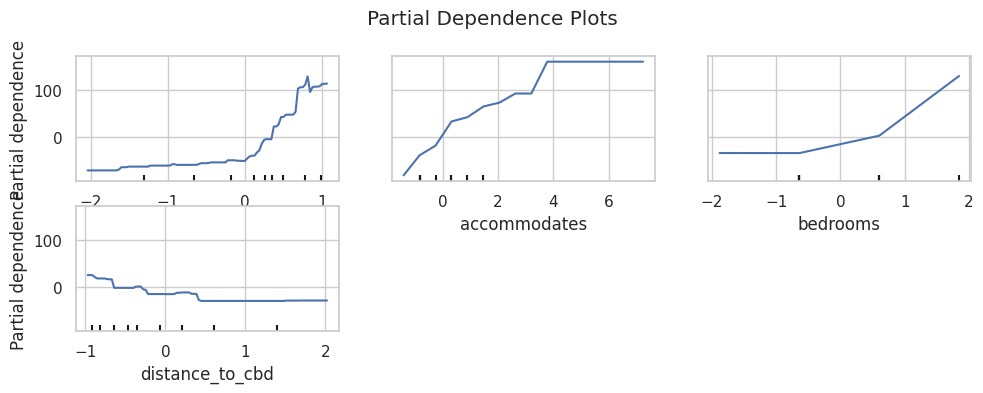


SHAP explanations skipped due to large dataset size (>1000 samples)

--- LIME Explanations ---

LIME Explanation for Instance 0:
[('accommodates <= -0.83', -85.39294477077232), ('-0.39 < longitude <= 0.27', -73.90176236867366), ('bedrooms <= -0.64', -67.69755919400444), ('bathrooms <= -0.57', -43.86514003005915), ('review_scores_value > 0.50', -20.611797569782425)]

LIME Explanation for Instance 1369:
[('-0.39 < longitude <= 0.27', -69.54368405240866), ('bedrooms <= -0.64', -64.93387650358254), ('bathrooms <= -0.57', -41.53375638127556), ('-0.36 < distance_to_cbd <= 0.35', -25.901261192443023), ('review_scores_cleanliness > 0.55', 22.458564241840705)]

LIME Explanation for Instance -1:
[('longitude <= -0.39', -100.20382947671732), ('-0.25 < accommodates <= 0.32', 51.215236857883575), ('bathrooms > 0.42', 44.46371981518007), ('review_scores_value <= -0.17', 27.33279055874887), ('-0.36 < distance_to_cbd <= 0.35', -26.02577138853396)]


In [31]:
X_train_interpret = X_train
X_test_interpret = X_test
scaler_interpret = StandardScaler()
X_train_scaled_interpret = scaler_interpret.fit_transform(X_train_interpret)
X_test_scaled_interpret = scaler_interpret.transform(X_test_interpret)

# Gradient Boosting Model for Interpretability
gbm_model_interpret = GradientBoostingRegressor(random_state=42)
gbm_model_interpret.fit(X_train_scaled_interpret, y_train)

# Store the trained model and data for interpretability
interpretability_data = {
    'model': gbm_model_interpret,
    'X_train': X_train_interpret,
    'X_test': X_test_interpret,
    'X_train_scaled': X_train_scaled_interpret,
    'X_test_scaled': X_test_scaled_interpret,
    'y_train': y_train,
    'y_test': y_test,
    'feature_names': X_train_interpret.columns.tolist()
}

# Permutation Importance
result_perm_imp = permutation_importance(
    gbm_model_interpret,
    X_test_scaled_interpret,
    y_test,
    n_repeats=10,
    random_state=123,
    scoring='neg_mean_absolute_error'
)

perm_importance_df = pd.DataFrame({
    'Feature': interpretability_data['feature_names'],
    'Importance': result_perm_imp.importances_mean,
    'Std': result_perm_imp.importances_std
}).sort_values('Importance', ascending=False)

print("\n--- Permutation Importance ---")
print(perm_importance_df.head(10))

# Partial Dependence Plots (PDP)
top_features_pdp = perm_importance_df['Feature'].head(4).tolist()
print(f"\nCreating PDP for: {top_features_pdp}")

fig, ax = plt.subplots(figsize=(10, 4))
PartialDependenceDisplay.from_estimator(
    gbm_model_interpret,
    X_train_scaled_interpret,
    features=top_features_pdp,
    feature_names=interpretability_data['feature_names'],
    kind='average',
    ax=ax
)
plt.suptitle('Partial Dependence Plots')
plt.tight_layout()
plt.show()

# SHAP Explanations (only calculate if dataset isn't too large)
if len(X_test_interpret) <= 1000:  # Limit for reasonable computation time
    print("\n--- SHAP Explanations ---")
    explainer_shap = shap.TreeExplainer(gbm_model_interpret)
    shap_values = explainer_shap.shap_values(X_test_scaled_interpret)

    print("\nSHAP Summary Plot:")
    shap.summary_plot(shap_values, X_test_scaled_interpret,
                     feature_names=interpretability_data['feature_names'])

    print(f"\nSHAP Dependence Plot for {top_features_pdp[0]}:")
    shap.dependence_plot(
        top_features_pdp[0],
        shap_values,
        X_test_scaled_interpret,
        feature_names=interpretability_data['feature_names']
    )
else:
    print("\nSHAP explanations skipped due to large dataset size (>1000 samples)")

# LIME Explanations (for a few representative samples)
print("\n--- LIME Explanations ---")
explainer_lime = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_scaled_interpret,
    feature_names=interpretability_data['feature_names'],
    mode='regression',
    verbose=False,
    random_state=42
)

# Explain 3 representative instances
for i in [0, len(X_test_interpret)//2, -1]:  # First, middle, last sample
    print(f"\nLIME Explanation for Instance {i}:")
    exp = explainer_lime.explain_instance(
        data_row=X_test_scaled_interpret[i],
        predict_fn=gbm_model_interpret.predict,
        num_features=5
    )
    # For Jupyter Notebook:
    # exp.show_in_notebook(show_all=False)

    # For script output:
    print(exp.as_list())


--- ANOVA for Price Differences by Room Type ---
F-statistic: 590.4, p-value: 0.000e+00

--- Correlation of Review Scores with Price ---
review_scores_value      0.027
review_scores_location   0.160
price                    1.000
Name: price, dtype: float64


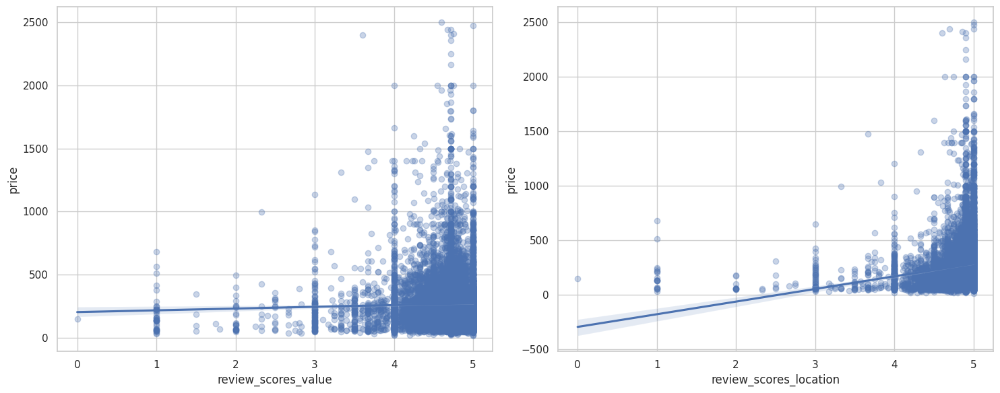

In [32]:
# ANOVA for room types
print("\n--- ANOVA for Price Differences by Room Type ---")
groups_room_type = [group['price'].values
                    for name, group in Sydney1.groupby('room_type')]
f_stat_room, p_value_room = f_oneway(*groups_room_type)
print(f"F-statistic: {f_stat_room:.1f}, p-value: {p_value_room:.3e}")

# Correlation of review scores with price
review_corrs = Sydney1[['price', 'review_scores_value', 'review_scores_location']].corr()
print("\n--- Correlation of Review Scores with Price ---")
print(review_corrs['price'].sort_values())

# Visual investigation of review scores vs price
fig, ax = plt.subplots(1, 2, figsize=(15, 6))
sns.regplot(x='review_scores_value', y='price', data=Sydney1, ax=ax[0], scatter_kws={'alpha':0.3})
sns.regplot(x='review_scores_location', y='price', data=Sydney1, ax=ax[1], scatter_kws={'alpha':0.3})
plt.tight_layout()
plt.show()